## Install Libraries & Master Functions

In [1]:
# Core modules import
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
from tqdm import tqdm

# Scrap/APIs modules
import requests
from bs4 import BeautifulSoup
import quandl
import investpy

#import missingno as msno
from IPython.core import display as ICD
from datetime import date
from datetime import datetime, timedelta

import pandas_ta as ta



## Dates features setting

In [2]:
start_year = date(2022, 1, 1) # for calculating Stock Flow Ratio 

today = date.today()  
yesterday = today - timedelta(days=1)
before_yesterday = yesterday - timedelta(days=1)

now = datetime.now()

if now.hour >= 2: #BITCOIN Closes at 2:00 AM Spain time each day
    to_date = yesterday.strftime("%d/%m/%Y")      # date in ivestpy format
    to_date_yf = yesterday.strftime("%Y-%m-%d")   # date in yahoo format
else:
    to_date = before_yesterday.strftime("%d/%m/%Y")
    to_date_yf= before_yesterday.strftime("%Y-%m-%d")


## Functions

In [3]:
# bitinfochart scrap function - source: medium.com

URL_array  = set()
def link2df(URL,col_name,join_df,join=True,check_column=True,check_URL = True,clear_URL_array=False,show_details=False):
    '''This function scraps the given link and returns dataframe
    __________
    Parameters:
        URL(string): URL to be scrapped from bitcoin website
        col_name(string): column name for dataframe
        join_df(variable)= dataframe withwhich output dataframe will be left joined on Date
        join(boolean)= iF True,join, else don't join
        check_column(boolean)= check if column name already exists
        check_URL(boolean)= check if URL is already processed
        clear_URL_array(boolean)= if true URL_processed array will be cleared
        show_details(boolean)= various details wil be printed such as scrapping first and last details, df head & df tail     
        '''
        
    print(f'processing {col_name}')

    #clear URL append array
    if clear_URL_array==True:
        URL_array.clear()

    #set join parameters if false
    if join == False:
        join_df = None
        check_column=False

    #process column name by making it lowercase and replacing spaces,commas, full stops
    col_name = col_name.lower().replace(',','').replace(" ", "_").replace(".", "_")

    #col_name validation if exists already
    if check_column==True and col_name in list(join_df.columns):
        print(f'column {col_name} already esists in dataframe, stopped here')
        return join_df

    #URL validation if processes already
    elif check_URL==True and URL in list(URL_array):
        print(f'{URL} is already processed, stopped here')
        return join_df 

    #web scrapping
    page = requests.get(URL)
    soup = page.content
    soup = str(soup)
    scraped_output = (soup.split('[[')[1]).split('{labels')[0][0:-2]
    if show_details == True:
        print('head')
        print({scraped_output[0:30]})
        print('tail')
        print({scraped_output[-30:]})

    processed_str = scraped_output.replace('new Date(','')
    processed_str = processed_str.replace(')','')
    processed_str = processed_str.replace('[','')
    processed_str = processed_str.replace(']','')
    processed_str = processed_str.replace('"','')

    processed_str_list = processed_str.split(',')
    date_list,data_list = processed_str_list[::2],processed_str_list[1::2]

    #validate column lengths
    if len(date_list)!=len(data_list):
        print(f'date & data length:{len(date_list),len(data_list),len(date_list)==len(data_list)}')

    #convert list data to a dataframe
    if join == False:
        df = pd.DataFrame()
        df['Date'] = pd.to_datetime(date_list)
        df[col_name] = data_list
        URL_array.add(URL)
        if show_details == True:
            print('*'*100)
            print('df head')
            print(df.head(1))
            print('*'*100)
            print('df tail')
            print(df.tail(1))
            print('*'*100)
            print(f'df shape{df.shape}')
            print('='*100)
            
        return df

    elif col_name not in list(join_df.columns) and join == True:
        df = pd.DataFrame()
        df['Date'] = pd.to_datetime(date_list)
        df[col_name] = data_list
        join_df = pd.merge(join_df,df,on=['Date'],how='left')
        URL_array.add(URL)
        if show_details == True:
            print('*'*100)
            print('df head')
            print(df.head(1))
            print('*'*100)
            print('df tail')
            print(df.tail(1))
            print('*'*100)
            print(f'output df shape= {df.shape},joined_df shape = {join_df.shape}')
            print('='*100)
            print(f'Number of duplicate columns in dataframe {df.columns.duplicated().sum()}')
            print('='*100)
    
        return join_df

## Features Scrap

### 01.BTC Price - Investpy API

In [4]:
final_df = investpy.get_crypto_historical_data(crypto='bitcoin',from_date='01/01/2013',to_date=to_date)
final_df = final_df.reset_index()
final_df.drop(['Currency','Volume'],inplace=True,axis=1)
final_df.columns = ['Date','opening_price','highest_price','lowest_price','closing_price']

### 02.Number of transactions in blockchain per day

In [5]:
final_df = link2df('https://bitinfocharts.com/comparison/bitcoin-transactions.html',
                   'transactions in blockchain',join_df=final_df,join=True)

processing transactions in blockchain


### 03.Average block size

In [6]:
final_df = link2df('https://bitinfocharts.com/comparison/size-btc.html',
                   'avg block size',join_df=final_df,join=True)

processing avg block size


### 04.Number of unique (from) addresses per day

In [7]:
final_df = link2df('https://bitinfocharts.com/comparison/sentbyaddress-btc.html',
                   'sent by adress',join_df=final_df,join=True)

processing sent by adress


### 05.Average mining difficulty per day

In [8]:
final_df = link2df('https://bitinfocharts.com/comparison/bitcoin-difficulty.html',
                   'avg mining difficulty',join_df=final_df,join=True)

processing avg mining difficulty


### 06.Average hashrate (hash/s) per day

In [9]:
final_df = link2df('https://bitinfocharts.com/comparison/bitcoin-hashrate.html',
                   'avg hashrate',join_df=final_df,join=True)

processing avg hashrate


### 07.Mining Profitability USD/Day for 1 Hash/s

In [10]:
final_df = link2df('https://bitinfocharts.com/comparison/bitcoin-mining_profitability.html',
                   'mining profitability',join_df=final_df,join=True)

processing mining profitability


### 08.Sent coins in USD per day

In [11]:
final_df = link2df('https://bitinfocharts.com/comparison/sentinusd-btc.html',
                   'Sent coins in USD',join_df=final_df,join=True)

processing Sent coins in USD


### 09.Average transaction fee, USD

In [12]:
final_df = link2df('https://bitinfocharts.com/comparison/bitcoin-transactionfees.html',
                   'avg transaction fees',join_df=final_df,join=True)

processing avg transaction fees


### 10.Median transaction fee, USD

In [13]:
final_df = link2df('https://bitinfocharts.com/comparison/bitcoin-median_transaction_fee.html',
                   'median transaction fees',join_df=final_df,join=True)

processing median transaction fees


### 11.Average block time (minutes)

In [14]:
final_df = link2df('https://bitinfocharts.com/comparison/bitcoin-confirmationtime.html',
                   'avg block time',join_df=final_df,join=True)

processing avg block time


### 12.Avg. Transaction Value, USD

In [15]:
final_df = link2df('https://bitinfocharts.com/comparison/transactionvalue-btc.html',
                   'avg transaction value',join_df=final_df,join=True)

processing avg transaction value


### 13.Median Transaction Value, USD

In [16]:
final_df = link2df('https://bitinfocharts.com/comparison/mediantransactionvalue-btc.html',
                   'median transaction value',join_df=final_df,join=True)

processing median transaction value


### 14.Tweets per day

In [17]:
final_df = link2df('https://bitinfocharts.com/comparison/tweets-btc.html',
                   'tweets_day',join_df=final_df,join=True)

processing tweets_day


### 15.Google Trends to "Bitcoin" @ 2012-01-01

In [18]:
final_df = link2df('https://bitinfocharts.com/comparison/google_trends-btc.html',
                   'google trends',join_df=final_df,join=True)

processing google trends


### 16.Number of unique (from or to) addresses per day

In [19]:
final_df = link2df('https://bitinfocharts.com/comparison/activeaddresses-btc.html',
                   'active addresses',join_df=final_df,join=True)

processing active addresses


### 17.Top 100 Richest Addresses to Total coins %

In [20]:
final_df = link2df('https://bitinfocharts.com/comparison/top100cap-btc.html',
                   'top100 to total percentage',join_df=final_df,join=True)

processing top100 to total percentage


### 18.Average Fee Percentage in Total Block Reward

In [21]:
final_df = link2df('https://bitinfocharts.com/comparison/fee_to_reward-btc.html',
                   'avg fee to reward',join_df=final_df,join=True)

processing avg fee to reward


### 19. Avg Price

In [22]:
final_df = link2df('https://bitinfocharts.com/comparison/bitcoin-price.html',
                   'avg price USD',join_df=final_df,join=True)

processing avg price USD


### 20. Avg Price

In [23]:
final_df = link2df('https://bitinfocharts.com/comparison/bitcoin-marketcap.html',
                   'market cap USD',join_df=final_df,join=True)




processing market cap USD


### 21.Total number of bitcoins in circulation and stockflow ratio

In [24]:
btc_in_circulation_df = quandl.get("BCHAIN/TOTBC",authtoken='9ztFCcK4_e1xGo_gjzK7')
btc_in_circulation_df = btc_in_circulation_df.rename(columns={'Value': 'number_of_coins_in_circulation'})

"""""Stockflow ratio:
    Stock – total bitcoin available at any given time 
    Flow – annual bitcoin “production” rate"""



df = btc_in_circulation_df.copy()
df=df.reset_index()

df['reward'] =  df['number_of_coins_in_circulation'] - df['number_of_coins_in_circulation'].shift(+1)
df['reward'][0] = 50

df['year'] = df['Date'].dt.year
reward = {i: df.loc[df['year'] ==i, 'reward'].sum() for i in df['year'].unique()}

reward[2022]= (reward[2022]/(today-start_year).days)*365 # lo anualizo

for i in df['year'].unique():
    df.loc[df['year'] ==i, 'annual_flow'] = reward[i]

df['sf_ratio'] = df['number_of_coins_in_circulation']/df['annual_flow']

final_df =  pd.merge(final_df,df[['sf_ratio','Date']],on=['Date'],how='left')
final_df = pd.merge(final_df,df[['number_of_coins_in_circulation','Date']],on=['Date'],how='left')

### 22.Bitcoin Miners Revenue
Total value of coinbase block rewards and transaction fees paid to miners.

In [25]:
miners_revenue_df = quandl.get("BCHAIN/MIREV",authtoken='9ztFCcK4_e1xGo_gjzK7')
miners_revenue_df = miners_revenue_df.rename(columns={'Value': 'miner_revenue'})
final_df = pd.merge(final_df,miners_revenue_df,on=['Date'],how='left')
final_df

,Date,opening_price,highest_price,lowest_price,closing_price,transactions_in_blockchain,avg_block_size,sent_by_adress,avg_mining_difficulty,avg_hashrate,...,tweets_day,google_trends,active_addresses,top100_to_total_percentage,avg_fee_to_reward,avg_price_usd,market_cap_usd,sf_ratio,number_of_coins_in_circulation,miner_revenue
0,2013-01-01,13.5,13.6,13.2,13.3,31734,89033,26174,2979637,24331539528899,...,NaN,1.194,37846,19.536,0.627,13.407,142303807,6.694616,10621175.00,5.264860e+04
1,2013-01-02,13.3,13.4,13.2,13.3,39280,114077,31809,2979637,22804647966378,...,NaN,1.497,43104,19.597,0.835,13.201,140170026,6.694868,10621575.00,5.486525e+04
2,2013-01-03,13.3,13.5,13.3,13.4,42147,108023,38197,2979637,23724885599725,...,NaN,1.798,51268,19.621,0.925,13.212,140337362,6.699359,10628700.00,4.811833e+04
3,2013-01-04,13.4,13.5,13.3,13.5,48436,141811,34990,2979637,22608181137438,...,NaN,1.841,47341,19.54,1,13.219,140459939,6.701707,10632425.00,5.087274e+04
4,2013-01-05,13.5,13.6,13.3,13.4,39455,118240,38008,2979637,22590695489434,...,NaN,1.826,53417,19.543,0.885,13.173,140021528,6.702195,10633200.00,5.139673e+04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3404,2022-04-28,39243.0,40382.0,38888.0,39748.0,275633,743223,498333,29794407589312,2.2571086029277E+20,...,161634,58.854,881750,15.488,1.349,39615,753662141843,56.437297,19025093.75,3.313335e+07
3405,2022-04-29,39748.0,39919.0,38175.0,38581.0,286413,714421,503708,29794407589312,2.1353200709118E+20,...,146452,50.07,901938,15.489,1.433,39101,743923761407,56.439893,19025968.75,3.725032e+07
3406,2022-04-30,38590.0,38776.0,37596.0,37650.0,261480,646810,422073,29794407589312,2.1825673813023E+20,...,119651,null,840027,15.486,1.104,38509,732699913008,56.442488,19026843.75,3.703131e+07
3407,2022-05-01,37642.0,38676.0,37397.0,38461.0,232155,462319,355988,29794407589312,2.3500932866158E+20,...,140890,NaN,709295,15.466,0.744,38058,724162204193,56.445770,19027950.00,4.052565e+07


### 23. LBMA GOLD

In [26]:
lbma_gold_df = quandl.get("LBMA/GOLD",authtoken='9ztFCcK4_e1xGo_gjzK7')
lbma_gold_df=pd.DataFrame(lbma_gold_df.iloc[:,1])
lbma_gold_df.rename(columns={ lbma_gold_df.columns[0]: "lbma_gold" }, inplace = True)
final_df = pd.merge(final_df,lbma_gold_df,on=['Date'],how='left')
final_df

,Date,opening_price,highest_price,lowest_price,closing_price,transactions_in_blockchain,avg_block_size,sent_by_adress,avg_mining_difficulty,avg_hashrate,...,google_trends,active_addresses,top100_to_total_percentage,avg_fee_to_reward,avg_price_usd,market_cap_usd,sf_ratio,number_of_coins_in_circulation,miner_revenue,lbma_gold
0,2013-01-01,13.5,13.6,13.2,13.3,31734,89033,26174,2979637,24331539528899,...,1.194,37846,19.536,0.627,13.407,142303807,6.694616,10621175.00,5.264860e+04,NaN
1,2013-01-02,13.3,13.4,13.2,13.3,39280,114077,31809,2979637,22804647966378,...,1.497,43104,19.597,0.835,13.201,140170026,6.694868,10621575.00,5.486525e+04,1693.75
2,2013-01-03,13.3,13.5,13.3,13.4,42147,108023,38197,2979637,23724885599725,...,1.798,51268,19.621,0.925,13.212,140337362,6.699359,10628700.00,4.811833e+04,1679.50
3,2013-01-04,13.4,13.5,13.3,13.5,48436,141811,34990,2979637,22608181137438,...,1.841,47341,19.54,1,13.219,140459939,6.701707,10632425.00,5.087274e+04,1648.00
4,2013-01-05,13.5,13.6,13.3,13.4,39455,118240,38008,2979637,22590695489434,...,1.826,53417,19.543,0.885,13.173,140021528,6.702195,10633200.00,5.139673e+04,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3404,2022-04-28,39243.0,40382.0,38888.0,39748.0,275633,743223,498333,29794407589312,2.2571086029277E+20,...,58.854,881750,15.488,1.349,39615,753662141843,56.437297,19025093.75,3.313335e+07,1888.50
3405,2022-04-29,39748.0,39919.0,38175.0,38581.0,286413,714421,503708,29794407589312,2.1353200709118E+20,...,50.07,901938,15.489,1.433,39101,743923761407,56.439893,19025968.75,3.725032e+07,1911.30
3406,2022-04-30,38590.0,38776.0,37596.0,37650.0,261480,646810,422073,29794407589312,2.1825673813023E+20,...,null,840027,15.486,1.104,38509,732699913008,56.442488,19026843.75,3.703131e+07,NaN
3407,2022-05-01,37642.0,38676.0,37397.0,38461.0,232155,462319,355988,29794407589312,2.3500932866158E+20,...,NaN,709295,15.466,0.744,38058,724162204193,56.445770,19027950.00,4.052565e+07,NaN


### 24. CBOE VIX

In [27]:
VIX_df = pd.read_csv("https://cdn.cboe.com/api/global/us_indices/daily_prices/VIX_History.csv")
VIX_df=pd.DataFrame(VIX_df[['DATE','CLOSE']])
VIX_df.rename(columns={ 'DATE':"Date", 'CLOSE':"VIX_spot" }, inplace = True)
VIX_df['Date'] = pd.to_datetime(
                          VIX_df['Date'],
                          format='%m/%d/%Y')
final_df = pd.merge(final_df,VIX_df,on=['Date'],how='left')
final_df

,Date,opening_price,highest_price,lowest_price,closing_price,transactions_in_blockchain,avg_block_size,sent_by_adress,avg_mining_difficulty,avg_hashrate,...,active_addresses,top100_to_total_percentage,avg_fee_to_reward,avg_price_usd,market_cap_usd,sf_ratio,number_of_coins_in_circulation,miner_revenue,lbma_gold,VIX_spot
0,2013-01-01,13.5,13.6,13.2,13.3,31734,89033,26174,2979637,24331539528899,...,37846,19.536,0.627,13.407,142303807,6.694616,10621175.00,5.264860e+04,NaN,NaN
1,2013-01-02,13.3,13.4,13.2,13.3,39280,114077,31809,2979637,22804647966378,...,43104,19.597,0.835,13.201,140170026,6.694868,10621575.00,5.486525e+04,1693.75,14.68
2,2013-01-03,13.3,13.5,13.3,13.4,42147,108023,38197,2979637,23724885599725,...,51268,19.621,0.925,13.212,140337362,6.699359,10628700.00,4.811833e+04,1679.50,14.56
3,2013-01-04,13.4,13.5,13.3,13.5,48436,141811,34990,2979637,22608181137438,...,47341,19.54,1,13.219,140459939,6.701707,10632425.00,5.087274e+04,1648.00,13.83
4,2013-01-05,13.5,13.6,13.3,13.4,39455,118240,38008,2979637,22590695489434,...,53417,19.543,0.885,13.173,140021528,6.702195,10633200.00,5.139673e+04,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3404,2022-04-28,39243.0,40382.0,38888.0,39748.0,275633,743223,498333,29794407589312,2.2571086029277E+20,...,881750,15.488,1.349,39615,753662141843,56.437297,19025093.75,3.313335e+07,1888.50,29.99
3405,2022-04-29,39748.0,39919.0,38175.0,38581.0,286413,714421,503708,29794407589312,2.1353200709118E+20,...,901938,15.489,1.433,39101,743923761407,56.439893,19025968.75,3.725032e+07,1911.30,33.40
3406,2022-04-30,38590.0,38776.0,37596.0,37650.0,261480,646810,422073,29794407589312,2.1825673813023E+20,...,840027,15.486,1.104,38509,732699913008,56.442488,19026843.75,3.703131e+07,NaN,NaN
3407,2022-05-01,37642.0,38676.0,37397.0,38461.0,232155,462319,355988,29794407589312,2.3500932866158E+20,...,709295,15.466,0.744,38058,724162204193,56.445770,19027950.00,4.052565e+07,NaN,NaN


### 26. ETHEREUM PRICE

In [28]:
ETH_df = investpy.get_crypto_historical_data(crypto='ethereum',from_date='01/01/2013',to_date=to_date)
ETH_df = ETH_df.reset_index()
ETH_df.rename(columns={ 'Close':"ETH_spot" }, inplace = True)
final_df = pd.merge(final_df,ETH_df[["ETH_spot",'Date']],on=['Date'],how='left')

### 27. MSCIACW

In [29]:
MSCIACW_df = investpy.indices.get_index_historical_data(country='World',index='MSCI AC World Equity',from_date='01/01/2013',to_date=to_date)
MSCIACW_df = MSCIACW_df.reset_index()
MSCIACW_df.rename(columns={ 'Close':"MSCIACW_spot" }, inplace = True)
final_df = pd.merge(final_df,MSCIACW_df[["MSCIACW_spot",'Date']],on=['Date'],how='left')

### 27. WTI USD

In [30]:
## https://es.investing.com/currencies/wti-usd-historical-data
WTI_df = investpy.commodities.get_commodity_historical_data(commodity='Crude Oil WTI', from_date='01/01/2013', to_date=to_date)
WTI_df = WTI_df.reset_index()
WTI_df.rename(columns={ 'Close':"WTI_spot" }, inplace = True)
final_df = pd.merge(final_df,WTI_df[["WTI_spot",'Date']],on=['Date'],how='left')

## 28-37 - FUTURES

In [31]:
# Download futures historical data for Altcoins index from ftx.com

FUTALT_df = requests.get('https://ftx.com/api/markets/ALT-PERP/candles?resolution=86400&start_time=0').json()
FUTALT_df = pd.DataFrame(FUTALT_df['result'])
FUTALT_df.drop(['startTime'], axis = 1, inplace=True)
FUTALT_df['time'] = pd.to_datetime(FUTALT_df['time'], unit='ms')
FUTALT_df

,time,open,high,low,close,volume
0,2019-07-20,767.50,805.7,745.40,780.40,1.521348e+06
1,2019-07-21,780.40,789.6,747.40,774.80,1.976499e+05
2,2019-07-22,774.80,784.0,731.50,743.80,1.429478e+05
3,2019-07-23,743.80,746.5,706.70,719.60,8.440968e+04
4,2019-07-24,719.60,746.4,692.40,739.70,1.139567e+05
...,...,...,...,...,...,...
1014,2022-04-29,3265.15,3285.8,3091.60,3134.60,2.061884e+07
1015,2022-04-30,3134.60,3180.7,2947.65,2982.15,4.748519e+06
1016,2022-05-01,2982.15,3123.4,2962.45,3103.10,7.943455e+06
1017,2022-05-02,3103.10,3150.0,3025.75,3102.20,1.412923e+07


In [32]:
import yfinance as yf

FUTMSCIACWI_df = yf.download('MMW=F', start='2012-02-01', end='2022-04-24')
FUTMSCIACWI_df=pd.DataFrame(FUTMSCIACWI_df[['Adj Close']])
FUTMSCIACWI_df.rename(columns={ 'Adj Close':"FUTMSCIACWI_spot" }, inplace = True)
final_df = pd.merge(final_df,FUTMSCIACWI_df,on=['Date'],how='left')
final_df



[*********************100%***********************]  1 of 1 completed


,Date,opening_price,highest_price,lowest_price,closing_price,transactions_in_blockchain,avg_block_size,sent_by_adress,avg_mining_difficulty,avg_hashrate,...,market_cap_usd,sf_ratio,number_of_coins_in_circulation,miner_revenue,lbma_gold,VIX_spot,ETH_spot,MSCIACW_spot,WTI_spot,FUTMSCIACWI_spot
0,2013-01-01,13.5,13.6,13.2,13.3,31734,89033,26174,2979637,24331539528899,...,142303807,6.694616,10621175.00,5.264860e+04,NaN,NaN,NaN,339.78,NaN,NaN
1,2013-01-02,13.3,13.4,13.2,13.3,39280,114077,31809,2979637,22804647966378,...,140170026,6.694868,10621575.00,5.486525e+04,1693.75,14.68,NaN,347.09,93.12,NaN
2,2013-01-03,13.3,13.5,13.3,13.4,42147,108023,38197,2979637,23724885599725,...,140337362,6.699359,10628700.00,4.811833e+04,1679.50,14.56,NaN,346.62,92.92,NaN
3,2013-01-04,13.4,13.5,13.3,13.5,48436,141811,34990,2979637,22608181137438,...,140459939,6.701707,10632425.00,5.087274e+04,1648.00,13.83,NaN,347.68,93.09,NaN
4,2013-01-05,13.5,13.6,13.3,13.4,39455,118240,38008,2979637,22590695489434,...,140021528,6.702195,10633200.00,5.139673e+04,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3404,2022-04-28,39243.0,40382.0,38888.0,39748.0,275633,743223,498333,29794407589312,2.2571086029277E+20,...,753662141843,56.437297,19025093.75,3.313335e+07,1888.50,29.99,2937.01,665.80,105.36,NaN
3405,2022-04-29,39748.0,39919.0,38175.0,38581.0,286413,714421,503708,29794407589312,2.1353200709118E+20,...,743923761407,56.439893,19025968.75,3.725032e+07,1911.30,33.40,2816.66,653.67,104.69,NaN
3406,2022-04-30,38590.0,38776.0,37596.0,37650.0,261480,646810,422073,29794407589312,2.1825673813023E+20,...,732699913008,56.442488,19026843.75,3.703131e+07,NaN,NaN,2727.18,NaN,NaN,NaN
3407,2022-05-01,37642.0,38676.0,37397.0,38461.0,232155,462319,355988,29794407589312,2.3500932866158E+20,...,724162204193,56.445770,19027950.00,4.052565e+07,NaN,NaN,2825.80,NaN,NaN,NaN


In [33]:
FUTBTC_df = yf.download('BTC=F', start='2012-02-01', end='2022-04-24')
FUTBTC_df=pd.DataFrame(FUTBTC_df[['Adj Close']])
FUTBTC_df.rename(columns={ 'Adj Close':"FUTBTC_spot" }, inplace = True)
final_df = pd.merge(final_df,FUTBTC_df,on=['Date'],how='left')

[*********************100%***********************]  1 of 1 completed


## 28-37 - FUTURES & SWAPS

Futures from investing.es

https://es.investing.com/indices/ice-mini-msci-acwi-ntr-c1-futures-historical-data
FUTMSCIACWI

https://es.investing.com/commodities/crude-oil-historical-data
FUTWTI

https://es.investing.com/indices/us-spx-500-futures-historical-data
FUT500

https://es.investing.com/commodities/gold-historical-data
FUTGOLD

https://es.investing.com/indices/us-spx-vix-futures-historical-data
FUTVIX

https://es.investing.com/crypto/bitcoin/bitcoin-futures-historical-data
FUTBTC

https://es.investing.com/currencies/us-dollar-index-historical-data
FUTDXY

Futures from intotheblock.com
FUTBASIS / SWAPBASIS
    

In [34]:
futures_list = ['FUTWTI','FUT500','FUTGOLD','FUTVIX','FUTDXY','SWAPBASIS','FUTBASIS']
for x in futures_list:
    globals()[str(x)+"_df"] = pd.read_csv('data/Futures/'+x+'.csv')

In [35]:
futures_list = ['FUTWTI_df','FUT500_df','FUTGOLD_df','FUTVIX_df','FUTDXY_df','SWAPBASIS_df','FUTBASIS_df','FUTALT_df']
SWAPBASIS_df.rename(columns = {'DateTime':'Fecha','Binance':'Último'},inplace=True)
FUTBASIS_df.rename(columns = {'DateTime':'Fecha', 'Huobi':'Último'},inplace=True)
FUTALT_df.rename(columns = {'time':'Fecha', 'close':'Último' },inplace=True)

SWAPBASIS_df['Fecha'] = pd.to_datetime(
                          SWAPBASIS_df['Fecha'],
                          format='%Y-%m-%d')

FUTBASIS_df['Fecha'] = pd.to_datetime(
                          FUTBASIS_df['Fecha'],
                          format='%Y-%m-%d')

for x in futures_list:
    print(x)
    ICD.display(globals()[x])
    globals()[x].drop_duplicates(subset='Fecha', keep='first', inplace=True, ignore_index=True)
    globals()[x].sort_values('Fecha', axis=0, ascending=True, inplace=True, ignore_index=True)
    print('from '+ str(globals()[x]['Fecha'][0])+ 'to '+ str(globals()[x]['Fecha'][(globals()[x].shape[0])-1]))
    print('len = ' +str(globals()[x].shape[0]))
    
    globals()[x]['Fecha'] = pd.to_datetime(
                          globals()[x]['Fecha'],
                          format='%d.%m.%Y')
    print('days between start and end period: ' + str((globals()[x]['Fecha'][(globals()[x].shape[0])-1]-globals()[x]['Fecha'][0]).days))
    print('\n')

FUTWTI_df


,Fecha,Último,Apertura,Máximo,Mínimo,Vol.,% var.
0,08.04.2022,"97,73","96,31","98,12","94,72",-,"1,77%"
1,07.04.2022,"96,03","97,16","98,82","93,81","367,32K","-0,21%"
2,06.04.2022,"96,23","101,24","104,02","95,73","366,04K","-5,62%"
3,05.04.2022,"101,96","103,66","105,59","99,88","280,28K","-1,28%"
4,04.04.2022,"103,28","98,95","103,94","98,05","288,13K","4,04%"
...,...,...,...,...,...,...,...
2635,15.03.2012,"105,11","105,50","106,18","103,78","371,04K","-0,30%"
2636,14.03.2012,"105,43","106,69","107,02","105,12","283,51K","-1,20%"
2637,13.03.2012,"106,71","106,55","107,35","105,67","282,35K","0,35%"
2638,12.03.2012,"106,34","107,50","107,56","105,38","234,73K","-0,99%"


from 01.01.2014to 31.12.2021
len = 2640
days between start and end period: 2921


FUT500_df


,Fecha,Último,Apertura,Máximo,Mínimo,Vol.,% var.
0,08.04.2022,"4.483,50","4.494,75","4.519,75","4.468,75","1,30M","-0,28%"
1,07.04.2022,"4.496,25","4.471,25","4.517,25","4.444,50","1,45M","0,46%"
2,06.04.2022,"4.475,75","4.526,25","4.528,75","4.444,50","1,80M","-0,98%"
3,05.04.2022,"4.520,25","4.576,25","4.588,75","4.507,75","1,30M","-1,26%"
4,04.04.2022,"4.577,75","4.538,25","4.580,00","4.527,75","1,03M","0,86%"
...,...,...,...,...,...,...,...
2648,15.03.2012,"1.401,75","1.394,00","1.403,00","1.390,50","354,75K","0,54%"
2649,14.03.2012,"1.394,25","1.396,50","1.399,75","1.390,00","511,16K","-0,14%"
2650,13.03.2012,"1.396,25","1.372,50","1.397,00","1.371,50","1,03M","1,73%"
2651,12.03.2012,"1.372,50","1.372,75","1.372,75","1.366,00","905,37K","0,00%"


from 01.01.2014to 31.12.2021
len = 2653
days between start and end period: 2921


FUTGOLD_df


,Fecha,Último,Apertura,Máximo,Mínimo,Vol.,% var.
0,14.04.2022,"1.974,90","1.981,60","1.984,00","1.962,70",-,"-0,49%"
1,13.04.2022,"1.984,70","1.970,50","1.985,80","1.966,30","132,03K","0,44%"
2,12.04.2022,"1.976,10","1.957,40","1.982,70","1.953,00","172,39K","1,43%"
3,11.04.2022,"1.948,20","1.949,60","1.974,60","1.942,90","184,39K","0,13%"
4,08.04.2022,"1.945,60","1.934,30","1.952,20","1.930,40","142,50K","0,40%"
...,...,...,...,...,...,...,...
2643,21.03.2012,"1.650,00","1.657,80","1.660,00","1.646,10","0,55K","0,20%"
2644,20.03.2012,"1.646,70","1.648,10","1.652,30","1.642,00","0,25K","-1,21%"
2645,19.03.2012,"1.666,90","1.661,20","1.668,00","1.652,10","0,46K","0,69%"
2646,16.03.2012,"1.655,50","1.660,00","1.663,40","1.641,30","0,32K","-0,22%"


from 01.01.2014to 31.12.2021
len = 2648
days between start and end period: 2921


FUTVIX_df


,Fecha,Último,Apertura,Máximo,Mínimo,Vol.,% var.
0,14.04.2022,"23,42","22,90","23,65","21,95","58,31K","3,24%"
1,13.04.2022,"22,69","24,90","25,00","22,50","58,56K","-9,49%"
2,12.04.2022,"25,06","24,75","25,55","23,30","68,45K","1,46%"
3,11.04.2022,"24,70","22,75","24,86","22,66","63,57K","8,13%"
4,08.04.2022,"22,85","23,10","23,70","22,00","49,98K","-0,56%"
...,...,...,...,...,...,...,...
2631,21.03.2012,"18,08","19,17","19,27","18,08",-,"-5,49%"
2632,20.03.2012,"19,13","20,30","20,83","19,13",-,"-4,26%"
2633,19.03.2012,"19,98","21,67","21,75","19,98",-,"23,88%"
2634,16.03.2012,"16,13","16,88","16,98","16,13",-,"-5,43%"


from 01.01.2014to 31.12.2021
len = 2636
days between start and end period: 2921


FUTDXY_df


,Fecha,Último,Apertura,Máximo,Mínimo,Vol.,% var.
0,14.04.2022,"100,552","99,823","100,765","99,565",-,"0,64%"
1,13.04.2022,"99,913","100,320","100,515","99,805","33,30K","-0,38%"
2,12.04.2022,"100,292","100,020","100,335","99,740","21,00K","0,37%"
3,11.04.2022,"99,924","99,690","100,050","99,610","14,58K","0,17%"
4,08.04.2022,"99,753","99,825","100,200","99,745","25,96K","-0,01%"
...,...,...,...,...,...,...,...
2602,20.03.2012,"79,825","79,755","80,100","79,685","13,89K","0,14%"
2603,19.03.2012,"79,712","80,065","80,185","79,605","20,19K","-0,03%"
2604,16.03.2012,"79,734","80,230","80,385","79,730",-,"-0,50%"
2605,15.03.2012,"80,136","80,630","80,725","80,025","22,10K","-0,50%"


from 01.01.2014to 31.12.2021
len = 2607
days between start and end period: 2921


SWAPBASIS_df


,Fecha,Último,Bitget,Gate.io
0,2020-02-09,0.002404,NaN,0.001193
1,2020-02-10,0.000445,NaN,0.002426
2,2020-02-11,-0.000506,NaN,0.000590
3,2020-02-12,0.002913,NaN,0.001417
4,2020-02-13,-0.000055,NaN,0.001582
...,...,...,...,...
788,2022-04-07,0.000849,0.000239,0.000535
789,2022-04-08,-0.000980,-0.000969,-0.001629
790,2022-04-09,-0.001801,-0.001502,-0.001930
791,2022-04-10,0.001098,0.001568,0.001887


from 2020-02-09 00:00:00to 2022-04-11 00:00:00
len = 793
days between start and end period: 792


FUTBASIS_df


,Fecha,Último,OKX
0,2021-11-02,0.004819,NaN
1,2021-11-03,0.004506,NaN
2,2021-11-04,0.002417,NaN
3,2021-11-05,0.005814,NaN
4,2021-11-06,0.005288,NaN
...,...,...,...
156,2022-04-07,-0.000830,-0.002503
157,2022-04-08,-0.001034,0.004009
158,2022-04-09,-0.001641,-0.000011
159,2022-04-10,-0.000504,0.001760


from 2021-11-02 00:00:00to 2022-04-11 00:00:00
len = 161
days between start and end period: 160


FUTALT_df


,Fecha,open,high,low,Último,volume
0,2019-07-20,767.50,805.7,745.40,780.40,1.521348e+06
1,2019-07-21,780.40,789.6,747.40,774.80,1.976499e+05
2,2019-07-22,774.80,784.0,731.50,743.80,1.429478e+05
3,2019-07-23,743.80,746.5,706.70,719.60,8.440968e+04
4,2019-07-24,719.60,746.4,692.40,739.70,1.139567e+05
...,...,...,...,...,...,...
1014,2022-04-29,3265.15,3285.8,3091.60,3134.60,2.061884e+07
1015,2022-04-30,3134.60,3180.7,2947.65,2982.15,4.748519e+06
1016,2022-05-01,2982.15,3123.4,2962.45,3103.10,7.943455e+06
1017,2022-05-02,3103.10,3150.0,3025.75,3102.20,1.412923e+07


from 2019-07-20 00:00:00to 2022-05-03 00:00:00
len = 1019
days between start and end period: 1018




In [36]:
for x in futures_list:
    globals()[x].rename(columns = {'Último': x[:-3],'Fecha':'Date'},inplace=True)
    final_df = pd.merge(final_df,globals()[x][[x[:-3],'Date']],on=['Date'],how='left')


In [37]:
 final_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3409 entries, 0 to 3408
Data columns (total 42 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   Date                            3409 non-null   datetime64[ns]
 1   opening_price                   3409 non-null   float64       
 2   highest_price                   3409 non-null   float64       
 3   lowest_price                    3409 non-null   float64       
 4   closing_price                   3409 non-null   float64       
 5   transactions_in_blockchain      3409 non-null   object        
 6   avg_block_size                  3409 non-null   object        
 7   sent_by_adress                  3409 non-null   object        
 8   avg_mining_difficulty           3409 non-null   object        
 9   avg_hashrate                    3409 non-null   object        
 10  mining_profitability            3409 non-null   object        
 11  sent

### 25. SP 500

In [38]:
import yfinance as yf
SP500_df = yf.download('SPY', start='2012-02-01', end='2022-04-24')
SP500_df=pd.DataFrame(SP500_df[['Adj Close']])
SP500_df.rename(columns={ 'Adj Close':"SP500_spot" }, inplace = True)
final_df = pd.merge(final_df,SP500_df,on=['Date'],how='left')
final_df

[*********************100%***********************]  1 of 1 completed


,Date,opening_price,highest_price,lowest_price,closing_price,transactions_in_blockchain,avg_block_size,sent_by_adress,avg_mining_difficulty,avg_hashrate,...,FUTBTC_spot,FUTWTI,FUT500,FUTGOLD,FUTVIX,FUTDXY,SWAPBASIS,FUTBASIS,FUTALT,SP500_spot
0,2013-01-01,13.5,13.6,13.2,13.3,31734,89033,26174,2979637,24331539528899,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2013-01-02,13.3,13.4,13.2,13.3,39280,114077,31809,2979637,22804647966378,...,NaN,"93,12","1.457,00","1.687,90","15,60","79,948",NaN,NaN,NaN,122.894363
2,2013-01-03,13.3,13.5,13.3,13.4,42147,108023,38197,2979637,23724885599725,...,NaN,"92,92","1.453,50","1.673,70","15,90","80,515",NaN,NaN,NaN,122.616699
3,2013-01-04,13.4,13.5,13.3,13.5,48436,141811,34990,2979637,22608181137438,...,NaN,"93,09","1.457,75","1.648,10","15,30","80,610",NaN,NaN,NaN,123.155228
4,2013-01-05,13.5,13.6,13.3,13.4,39455,118240,38008,2979637,22590695489434,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3404,2022-04-28,39243.0,40382.0,38888.0,39748.0,275633,743223,498333,29794407589312,2.2571086029277E+20,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3265.15,NaN
3405,2022-04-29,39748.0,39919.0,38175.0,38581.0,286413,714421,503708,29794407589312,2.1353200709118E+20,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3134.60,NaN
3406,2022-04-30,38590.0,38776.0,37596.0,37650.0,261480,646810,422073,29794407589312,2.1825673813023E+20,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2982.15,NaN
3407,2022-05-01,37642.0,38676.0,37397.0,38461.0,232155,462319,355988,29794407589312,2.3500932866158E+20,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3103.10,NaN


### 26. DXY

In [39]:
dxy_df= yf.download('DX-Y.NYB', start='1993-02-01', end='2022-04-24') 
dxy_df=pd.DataFrame(dxy_df[['Adj Close']])
dxy_df.rename(columns={ 'Adj Close':"DXY_spot" }, inplace = True)
final_df = pd.merge(final_df,dxy_df,on=['Date'],how='left')
final_df

[*********************100%***********************]  1 of 1 completed


,Date,opening_price,highest_price,lowest_price,closing_price,transactions_in_blockchain,avg_block_size,sent_by_adress,avg_mining_difficulty,avg_hashrate,...,FUTWTI,FUT500,FUTGOLD,FUTVIX,FUTDXY,SWAPBASIS,FUTBASIS,FUTALT,SP500_spot,DXY_spot
0,2013-01-01,13.5,13.6,13.2,13.3,31734,89033,26174,2979637,24331539528899,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2013-01-02,13.3,13.4,13.2,13.3,39280,114077,31809,2979637,22804647966378,...,"93,12","1.457,00","1.687,90","15,60","79,948",NaN,NaN,NaN,122.894363,79.849998
2,2013-01-03,13.3,13.5,13.3,13.4,42147,108023,38197,2979637,23724885599725,...,"92,92","1.453,50","1.673,70","15,90","80,515",NaN,NaN,NaN,122.616699,80.430000
3,2013-01-04,13.4,13.5,13.3,13.5,48436,141811,34990,2979637,22608181137438,...,"93,09","1.457,75","1.648,10","15,30","80,610",NaN,NaN,NaN,123.155228,80.500000
4,2013-01-05,13.5,13.6,13.3,13.4,39455,118240,38008,2979637,22590695489434,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3404,2022-04-28,39243.0,40382.0,38888.0,39748.0,275633,743223,498333,29794407589312,2.2571086029277E+20,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3265.15,NaN,NaN
3405,2022-04-29,39748.0,39919.0,38175.0,38581.0,286413,714421,503708,29794407589312,2.1353200709118E+20,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3134.60,NaN,NaN
3406,2022-04-30,38590.0,38776.0,37596.0,37650.0,261480,646810,422073,29794407589312,2.1825673813023E+20,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2982.15,NaN,NaN
3407,2022-05-01,37642.0,38676.0,37397.0,38461.0,232155,462319,355988,29794407589312,2.3500932866158E+20,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3103.10,NaN,NaN


### 27. BDM excluding large caps - spglobal.com

In [40]:
BDM_df = pd.read_excel('data/BDM.xls', header=6, nrows=1337)
BDM_df['Effective date '] = pd.to_datetime(
                          BDM_df['Effective date '],
                          format='%Y-%m-%d')
BDM_df.rename(columns={ 'S&P Cryptocurrency BDM Ex-MegaCap Index (USD)':"BDM_spot",'Effective date ':"Date" }, inplace = True)

final_df = pd.merge(final_df,BDM_df,on=['Date'],how='left')

## 38-50 - INTOTHEBLOCK VARIABLES

In [41]:
import os
current_file= ''
block_df_list=[]

block_list= list(os.listdir('data/Block'))
block_list.reverse()    # to have initial files first 
for x in block_list:
    if current_file!=x[4:11]:  # 4 for avoid naming of the file btc 
        globals()[str(x[4:-4])+"_df"] = pd.read_csv('data/Block/'+x) # 4 for avoid naming of the file btc and -4 to avoid ending csv
        current_file = x[4:11]
        
        block_df_list.append(str(x[4:-4])+"_df")
        
        df_name = str(x[4:-4])+"_df"
    
    else:
        temp_df= pd.read_csv('data/Block/'+x)
        globals()[df_name] = pd.concat([globals()[df_name],temp_df],axis=0)
        


In [42]:


for x in block_df_list:
    globals()[x].drop_duplicates(subset='DateTime', keep='first', inplace=True, ignore_index=True)
    globals()[x].sort_values('DateTime', axis=0, ascending=True, inplace=True, ignore_index=True)
    print(x)
    ICD.display(globals()[x])
    print('from '+ str(globals()[x]['DateTime'][0])+ 'to '+ str(globals()[x]['DateTime'][(globals()[x].shape[0])-1]))
    print('len = ' +str(globals()[x].shape[0]))
    
    globals()[x]['DateTime'] = pd.to_datetime(
                          globals()[x]['DateTime'],
                          format='%Y-%m-%d')
    print('days between start and end period: ' + str((globals()[x]['DateTime'][(globals()[x].shape[0])-1]-globals()[x]['DateTime'][0]).days))
    print('\n')

volatility_df


,DateTime,Volatility,Price
0,2017-01-01 00:00:00,0.317969,978.86
1,2017-01-02 00:00:00,0.326711,1010.94
2,2017-01-03 00:00:00,0.324877,1021.00
3,2017-01-04 00:00:00,0.367290,1085.43
4,2017-01-05 00:00:00,0.458322,1012.58
...,...,...,...
1922,2022-04-07 00:00:00,0.404228,43330.58
1923,2022-04-08 00:00:00,0.367508,43052.91
1924,2022-04-09 00:00:00,0.370888,42474.54
1925,2022-04-10 00:00:00,0.352933,42682.04


from 2017-01-01 00:00:00to 2022-04-11 00:00:00
len = 1927
days between start and end period: 1926


unspent_age_df


,DateTime,Price,>5y,3y-5y,2y-3y,18m-24m,12m-18m,6m-12m,3m-6m,1m-3m,1w-1m,1d-1w,<1d
0,2009-01-03 00:00:00,NaN,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,50.000000
1,2009-01-04 00:00:00,NaN,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,50.000000,0.000000
2,2009-01-05 00:00:00,NaN,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,50.000000,0.000000
3,2009-01-06 00:00:00,NaN,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,50.000000,0.000000
4,2009-01-07 00:00:00,NaN,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,50.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4841,2022-04-06 00:00:00,44324.040,4.356845e+06,2.860324e+06,1.258761e+06,750220.242336,2.829728e+06,2.190463e+06,1.649760e+06,1.438278e+06,886594.666920,469799.446779,313978.409863
4842,2022-04-07 00:00:00,43330.575,4.357217e+06,2.860813e+06,1.259645e+06,749133.683320,2.833936e+06,2.187318e+06,1.654384e+06,1.443704e+06,929717.880544,396636.934211,333109.479294
4843,2022-04-08 00:00:00,43052.905,4.358382e+06,2.859575e+06,1.259869e+06,748852.763052,2.844998e+06,2.183759e+06,1.644318e+06,1.480746e+06,927486.422558,373563.911970,324904.077405
4844,2022-04-09 00:00:00,42474.540,4.358987e+06,2.859099e+06,1.260958e+06,749224.673036,2.850323e+06,2.188936e+06,1.639707e+06,1.487995e+06,925909.060693,482755.436910,203514.656650


from 2009-01-03 00:00:00to 2022-04-10 00:00:00
len = 4846
days between start and end period: 4845


twitter_df


,DateTime,Positive,Neutral,Negative,Price
0,2019-07-19 00:00:00,908.0,6289.0,297.0,10446.285
1,2019-07-20 00:00:00,1553.0,9950.0,429.0,10736.755
2,2019-07-21 00:00:00,1392.0,9478.0,360.0,10581.940
3,2019-07-22 00:00:00,1706.0,10734.0,444.0,10374.335
4,2019-07-23 00:00:00,1554.0,10801.0,473.0,10074.525
...,...,...,...,...,...
992,2022-04-06 00:00:00,10834.0,24877.0,1480.0,44324.040
993,2022-04-07 00:00:00,4456.0,10947.0,601.0,43330.575
994,2022-04-08 00:00:00,4649.0,11731.0,445.0,43052.905
995,2022-04-09 00:00:00,10897.0,20660.0,1196.0,42474.540


from 2019-07-19 00:00:00to 2022-04-10 00:00:00
len = 997
days between start and end period: 996


transactions_volume_df


,DateTime,Total Volume,Price
0,2009-01-03 00:00:00,0.000000e+00,NaN
1,2009-01-04 00:00:00,0.000000e+00,NaN
2,2009-01-05 00:00:00,0.000000e+00,NaN
3,2009-01-06 00:00:00,0.000000e+00,NaN
4,2009-01-07 00:00:00,0.000000e+00,NaN
...,...,...,...
4841,2022-04-06 00:00:00,4.902828e+10,44324.040
4842,2022-04-07 00:00:00,5.069629e+10,43330.575
4843,2022-04-08 00:00:00,5.521767e+10,43052.905
4844,2022-04-09 00:00:00,1.957337e+10,42474.540


from 2009-01-03 00:00:00to 2022-04-10 00:00:00
len = 4846
days between start and end period: 4845


telegram_df


,DateTime,Positive,Neutral,Negative,Price
0,2019-07-19 00:00:00,4.0,26.0,4.0,10446.285
1,2019-07-20 00:00:00,2.0,17.0,2.0,10736.755
2,2019-07-21 00:00:00,1.0,17.0,0.0,10581.940
3,2019-07-22 00:00:00,0.0,26.0,2.0,10374.335
4,2019-07-23 00:00:00,1.0,13.0,1.0,10074.525
...,...,...,...,...,...
992,2022-04-06 00:00:00,18625.0,7978.0,625.0,44324.040
993,2022-04-07 00:00:00,14058.0,3646.0,230.0,43330.575
994,2022-04-08 00:00:00,10430.0,4044.0,262.0,43052.905
995,2022-04-09 00:00:00,2909.0,4823.0,382.0,42474.540


from 2019-07-19 00:00:00to 2022-04-10 00:00:00
len = 997
days between start and end period: 996


number_of_transactions_df


,DateTime,Number of Transactions,Price
0,2009-01-03 00:00:00,1,NaN
1,2009-01-04 00:00:00,0,NaN
2,2009-01-05 00:00:00,0,NaN
3,2009-01-06 00:00:00,0,NaN
4,2009-01-07 00:00:00,0,NaN
...,...,...,...
4841,2022-04-06 00:00:00,273640,44324.040
4842,2022-04-07 00:00:00,269404,43330.575
4843,2022-04-08 00:00:00,266805,43052.905
4844,2022-04-09 00:00:00,232792,42474.540


from 2009-01-03 00:00:00to 2022-04-10 00:00:00
len = 4846
days between start and end period: 4845


large_transactions_usd_df


,DateTime,Total Volume,Price,Number of Large Transactions
0,2011-12-26 00:00:00,NaN,4.06,0.0
1,2011-12-27 00:00:00,NaN,4.03,0.0
2,2011-12-28 00:00:00,NaN,4.12,0.0
3,2011-12-29 00:00:00,NaN,4.22,0.0
4,2011-12-30 00:00:00,0.000000e+00,4.18,NaN
...,...,...,...,...
3754,2022-04-06 00:00:00,4.787584e+10,44324.04,NaN
3755,2022-04-07 00:00:00,4.955920e+10,43330.58,NaN
3756,2022-04-08 00:00:00,5.414556e+10,43052.91,NaN
3757,2022-04-09 00:00:00,1.871991e+10,42474.54,NaN


from 2011-12-26 00:00:00to 2022-04-10 00:00:00
len = 3759
days between start and end period: 3758


large_holders_netflow_df


,DateTime,Netflow,Price
0,2011-12-13 00:00:00,-0.020000,3.20
1,2011-12-14 00:00:00,0.000000,3.12
2,2011-12-15 00:00:00,17901.000000,3.16
3,2011-12-16 00:00:00,19249.900000,3.19
4,2011-12-17 00:00:00,9676.290000,3.20
...,...,...,...
3767,2022-04-06 00:00:00,-3523.486164,44324.04
3768,2022-04-07 00:00:00,51963.240000,43330.58
3769,2022-04-08 00:00:00,49638.000000,43052.91
3770,2022-04-09 00:00:00,74.200000,42474.54


from 2011-12-13 00:00:00to 2022-04-10 00:00:00
len = 3772
days between start and end period: 3771


in_outs_df


,DateTime,Price,Out,At,In
0,2011-12-27 00:00:00,4.03,373106,19148,119834
1,2011-12-28 00:00:00,4.12,372322,16315,123709
2,2011-12-29 00:00:00,4.22,371990,12894,128064
3,2011-12-30 00:00:00,4.18,372008,17153,124183
4,2011-12-31 00:00:00,4.60,370089,4652,138663
...,...,...,...,...,...
3750,2022-04-06 00:00:00,44324.04,13007950,1487564,30795607
3751,2022-04-07 00:00:00,43330.58,13659331,1570947,30088522
3752,2022-04-08 00:00:00,43052.91,13903995,1665081,29809240
3753,2022-04-09 00:00:00,42474.54,14302803,2034774,29081118


from 2011-12-27 00:00:00to 2022-04-10 00:00:00
len = 3755
days between start and end period: 3757


github_df


,DateTime,Commits,Stars,Open Issues
0,2020-05-05 00:00:00,26966,47465,579
1,2020-05-06 00:00:00,26988,47475,579
2,2020-05-07 00:00:00,27006,47491,572
3,2020-05-08 00:00:00,27010,47509,568
4,2020-05-09 00:00:00,27026,47525,504
...,...,...,...,...
702,2022-04-07 00:00:00,37014,69855,618
703,2022-04-08 00:00:00,37019,69886,619
704,2022-04-09 00:00:00,37024,69911,618
705,2022-04-10 00:00:00,37033,69935,619


from 2020-05-05 00:00:00to 2022-04-11 00:00:00
len = 707
days between start and end period: 706


daily_active_addresses_df


,DateTime,New Addresses,Active Addresses,Zero Balance Addresses,Price
0,2009-01-03 00:00:00,1,1,0,NaN
1,2009-01-04 00:00:00,0,0,0,NaN
2,2009-01-05 00:00:00,0,0,0,NaN
3,2009-01-06 00:00:00,0,0,0,NaN
4,2009-01-07 00:00:00,0,0,0,NaN
...,...,...,...,...,...
4841,2022-04-06 00:00:00,422760,928405,436017,44324.040
4842,2022-04-07 00:00:00,431582,943697,434885,43330.575
4843,2022-04-08 00:00:00,426364,932330,430449,43052.905
4844,2022-04-09 00:00:00,376801,813141,371224,42474.540


from 2009-01-03 00:00:00to 2022-04-10 00:00:00
len = 4846
days between start and end period: 4845


bulls_and_bears_V_df


,DateTime,Bulls,Bears,Difference
0,2011-12-11 00:00:00,68128.90,-105325.16,-37196.26
1,2011-12-12 00:00:00,92178.62,-117862.66,-25684.04
2,2011-12-13 00:00:00,50018.26,-57132.21,-7113.95
3,2011-12-14 00:00:00,134851.96,-134774.26,77.70
4,2011-12-15 00:00:00,83874.90,-88889.81,-5014.91
...,...,...,...,...
3628,2022-04-06 00:00:00,4857165.60,-4857440.53,-274.93
3629,2022-04-07 00:00:00,4064742.27,-4064137.64,604.63
3630,2022-04-08 00:00:00,3465573.03,-3465720.47,-147.44
3631,2022-04-09 00:00:00,2719068.41,-2718990.69,77.72


from 2011-12-11 00:00:00to 2022-04-10 00:00:00
len = 3633
days between start and end period: 3773


break_even_df


,DateTime,Price,Losses,Break Even,Profit
0,2011-12-26 00:00:00,4.06,375224,15610,120556
1,2011-12-27 00:00:00,4.03,375204,17039,119845
2,2011-12-28 00:00:00,4.12,374431,14465,123450
3,2011-12-29 00:00:00,4.22,374101,11407,127440
4,2011-12-30 00:00:00,4.18,374174,15181,123989
...,...,...,...,...,...
3753,2022-04-06 00:00:00,44324.04,13087218,1340304,30863599
3754,2022-04-07 00:00:00,43330.58,13709046,1413996,30195758
3755,2022-04-08 00:00:00,43052.91,13968266,1463072,29946978
3756,2022-04-09 00:00:00,42474.54,14338468,1810305,29269922


from 2011-12-26 00:00:00to 2022-04-10 00:00:00
len = 3758
days between start and end period: 3758




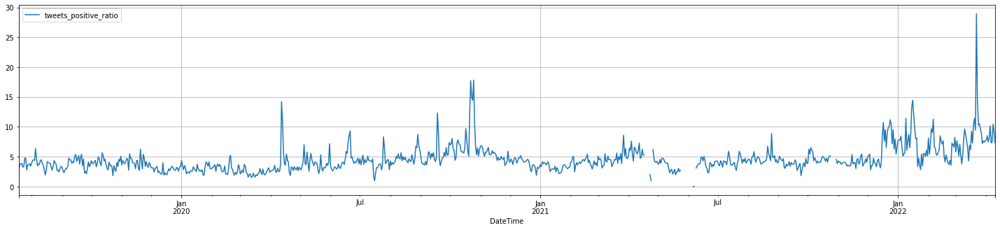

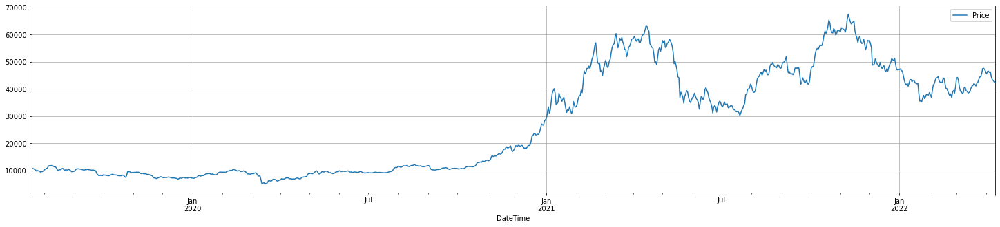

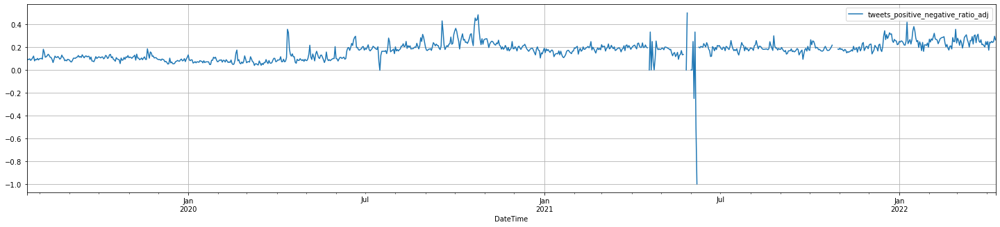

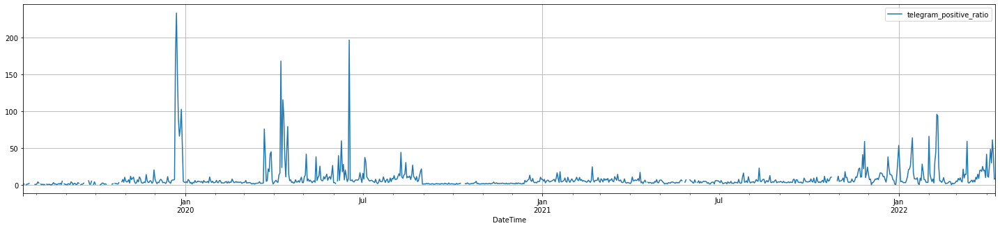

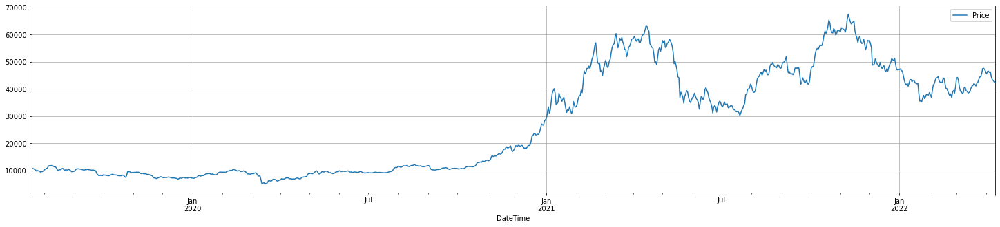

...

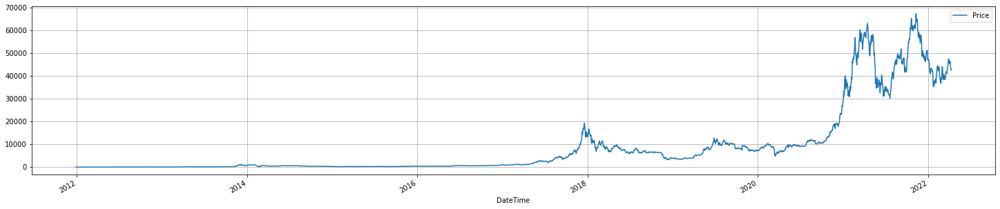

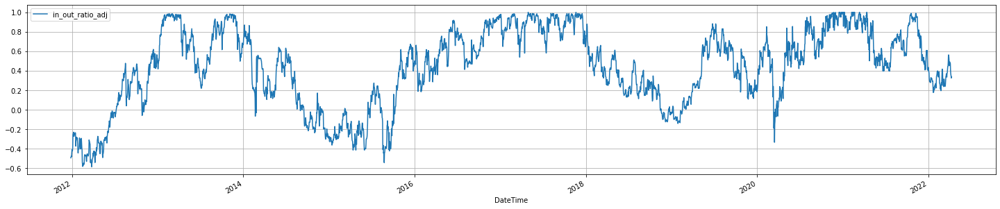

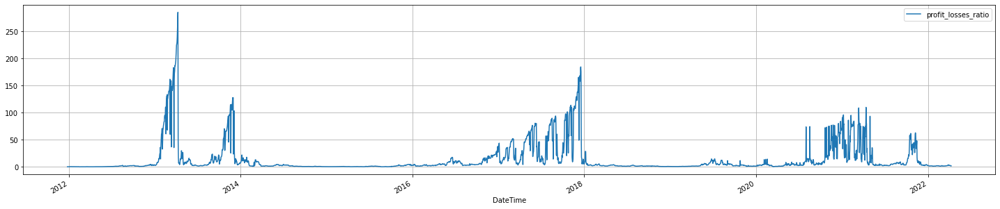

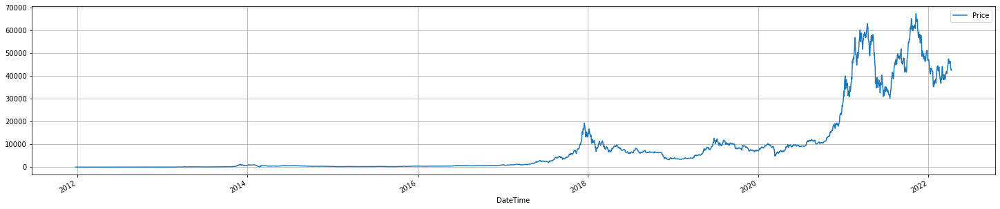

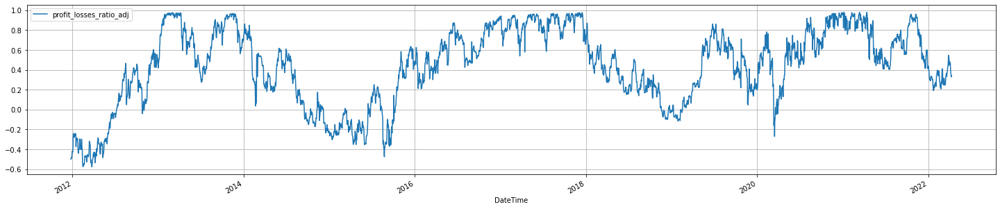

In [43]:
##RATIOS CALCULATION 

#Tweets
twitter_df['tweets_positive_ratio']= (twitter_df['Positive'] / twitter_df['Negative'])
twitter_df['tweets_positive_negative_ratio_adj']= (twitter_df['Positive'] - twitter_df['Negative'])/ (twitter_df['Positive'] + twitter_df['Negative'] + twitter_df['Neutral'] )


twitter_df.plot(x='DateTime',y=['tweets_positive_ratio'],figsize=(25,5),grid=True)
plt.show()

twitter_df.plot(x='DateTime',y=['Price'],figsize=(25,5),grid=True)
plt.show()

twitter_df.plot(x='DateTime',y=['tweets_positive_negative_ratio_adj'],figsize=(25,5),grid=True)
plt.show()



telegram_df['telegram_positive_ratio']= telegram_df['Positive'] / telegram_df['Negative']
telegram_df['telegram_positive_ratio_adj']= (telegram_df['Positive'] - telegram_df['Negative']) / (telegram_df['Positive'] + telegram_df['Negative'] + telegram_df['Neutral'])

telegram_df.plot(x='DateTime',y=['telegram_positive_ratio'],figsize=(25,5),grid=True)
plt.show()

telegram_df.plot(x='DateTime',y=['Price'],figsize=(25,5),grid=True)
plt.show()


telegram_df.plot(x='DateTime',y=['telegram_positive_ratio_adj'],figsize=(25,5),grid=True)
plt.show()



# In/out the money and profit/looses ratio    by number of addresses both

in_outs_df['in_out_ratio']= in_outs_df['In'] / in_outs_df['Out']
in_outs_df['in_out_ratio_adj']= (in_outs_df['In'] - in_outs_df['Out'])/(in_outs_df['In'] + in_outs_df['Out'] + in_outs_df['At'])
in_outs_df

in_outs_df.plot(x='DateTime',y=['in_out_ratio'],figsize=(25,5),grid=True)
plt.show()

in_outs_df.plot(x='DateTime',y=['Price'],figsize=(25,5),grid=True)
plt.show()

in_outs_df.plot(x='DateTime',y=['in_out_ratio_adj'],figsize=(25,5),grid=True)
plt.show()

break_even_df['profit_losses_ratio']= break_even_df['Profit'] / break_even_df['Losses']
break_even_df['profit_losses_ratio_adj']= (break_even_df['Profit'] - break_even_df['Losses']) / (break_even_df['Profit'] + break_even_df['Losses'] + break_even_df['Break Even'])
#final_df = pd.merge(final_df,break_even_df.rename(columns = {'DateTime':'Date'})[['profit_losses_ratio','Date']],on=['Date'],how='left')


break_even_df.plot(x='DateTime',y=['profit_losses_ratio'],figsize=(25,5),grid=True)
plt.show()

break_even_df.plot(x='DateTime',y=['Price'],figsize=(25,5),grid=True)
plt.show()

break_even_df.plot(x='DateTime',y=['profit_losses_ratio_adj'],figsize=(25,5),grid=True)
plt.show()

In [44]:
### I prefer dividing between the total but lets see the outliers in twitter and telegram

twitter_df.nsmallest(20, 'tweets_positive_negative_ratio_adj')
#df[df.Points == df.Points.min()])

,DateTime,Positive,Neutral,Negative,Price,tweets_positive_ratio,tweets_positive_negative_ratio_adj
689,2021-06-07,0.0,0.0,1.0,35078.755,0.000000,-1.000000
688,2021-06-06,0.0,1.0,1.0,35859.075,0.000000,-0.500000
686,2021-06-04,0.0,9.0,3.0,37445.260,0.000000,-0.250000
363,2020-07-16,13297.0,49082.0,13558.0,9122.850,0.980749,-0.003437
640,2021-04-19,0.0,4.0,0.0,55940.860,NaN,0.000000
642,2021-04-21,0.0,13.0,0.0,55221.375,NaN,0.000000
645,2021-04-24,1.0,4.0,1.0,49996.670,1.000000,0.000000
678,2021-05-27,0.0,1.0,0.0,38810.395,NaN,0.000000
683,2021-06-01,0.0,1.0,0.0,36821.855,NaN,0.000000
684,2021-06-02,0.0,3.0,0.0,37080.260,NaN,0.000000


In [45]:
twitter_df['number_tweets'] = twitter_df['Positive'] + twitter_df['Negative'] + twitter_df['Neutral']
twitter_df.nsmallest(20, 'number_tweets')

,DateTime,Positive,Neutral,Negative,Price,tweets_positive_ratio,tweets_positive_negative_ratio_adj,number_tweets
678,2021-05-27,0.0,1.0,0.0,38810.395,NaN,0.000000,1.0
683,2021-06-01,0.0,1.0,0.0,36821.855,NaN,0.000000,1.0
689,2021-06-07,0.0,0.0,1.0,35078.755,0.000000,-1.000000,1.0
681,2021-05-30,1.0,1.0,0.0,34941.135,inf,0.500000,2.0
688,2021-06-06,0.0,1.0,1.0,35859.075,0.000000,-0.500000,2.0
641,2021-04-20,1.0,2.0,0.0,55265.390,inf,0.333333,3.0
684,2021-06-02,0.0,3.0,0.0,37080.260,NaN,0.000000,3.0
687,2021-06-05,1.0,2.0,0.0,36378.960,inf,0.333333,3.0
640,2021-04-19,0.0,4.0,0.0,55940.860,NaN,0.000000,4.0
685,2021-06-03,1.0,3.0,0.0,38341.190,inf,0.250000,4.0


In [46]:
# Set the value to non relevant datapoints to Nan (it wil be filled later)
mask= twitter_df.number_tweets < 100
twitter_df.loc[mask, 'tweets_positive_negative_ratio_adj'] = np.nan
twitter_df.loc[mask, 'tweets_positive_negative_ratio_adj']

640   NaN
641   NaN
642   NaN
643   NaN
644   NaN
645   NaN
646   NaN
678   NaN
679   NaN
681   NaN
683   NaN
684   NaN
685   NaN
686   NaN
687   NaN
688   NaN
689   NaN
Name: tweets_positive_negative_ratio_adj, dtype: float64

In [47]:
telegram_df.nsmallest(20,'telegram_positive_ratio_adj')

,DateTime,Positive,Neutral,Negative,Price,telegram_positive_ratio,telegram_positive_ratio_adj
869,2021-12-04,362.0,1789.0,3355.0,48717.135,0.107899,-0.543589
918,2022-01-22,3857.0,5691.0,14188.0,35471.105,0.271849,-0.435246
894,2021-12-29,1899.0,4121.0,6765.0,47126.565,0.280710,-0.380602
951,2022-02-24,931.0,4081.0,4483.0,36766.010,0.207673,-0.374092
19,2019-08-07,1.0,23.0,7.0,11766.265,0.142857,-0.193548
21,2019-08-09,1.0,30.0,8.0,11850.815,0.125000,-0.179487
10,2019-07-29,0.0,18.0,3.0,9552.295,0.000000,-0.142857
22,2019-08-10,2.0,15.0,5.0,11601.885,0.400000,-0.136364
45,2019-09-02,0.0,29.0,4.0,10111.880,0.000000,-0.121212
34,2019-08-22,3.0,24.0,7.0,10004.525,0.428571,-0.117647


In [48]:
telegram_df.nlargest(20,'telegram_positive_ratio_adj')

,DateTime,Positive,Neutral,Negative,Price,telegram_positive_ratio,telegram_positive_ratio_adj
162,2019-12-28,2052.0,108.0,20.0,7310.850,102.600000,0.932110
157,2019-12-23,3969.0,271.0,17.0,7484.965,233.470588,0.928353
156,2019-12-22,1943.0,199.0,11.0,7335.285,176.636364,0.897353
161,2019-12-27,1625.0,201.0,21.0,7164.535,77.380952,0.868435
937,2022-02-10,23568.0,3136.0,252.0,44545.715,93.523810,0.864965
158,2019-12-24,2529.0,372.0,17.0,7302.460,148.764706,0.860864
160,2019-12-26,1122.0,183.0,17.0,7304.825,66.000000,0.835855
936,2022-02-09,15511.0,2936.0,162.0,44008.555,95.746914,0.824816
163,2019-12-29,1564.0,274.0,30.0,7417.990,52.133333,0.821199
247,2020-03-22,1442.0,291.0,19.0,6082.910,75.894737,0.812215


In [49]:
#BTC volatility

final_df = pd.merge(final_df,volatility_df.rename(columns = {'Volatility':'bc_volatility','DateTime':'Date'})[['bc_volatility','Date']],on=['Date'],how='left')
     
""""unspent  If short-term UTXOs (red and yellow) are spiking for a significant period this points to a late bull market, 
otential bubble phase as money entering surpasses relative long-term volumes"""

#Short term UTXOs
short_term_UTXOs_df = pd.DataFrame()
short_term_UTXOs_df['Date'] = unspent_age_df['DateTime']
short_term_UTXOs_df['ST_UTXOs'] = unspent_age_df['1m-3m'] + unspent_age_df['1w-1m'] + unspent_age_df['1d-1w'] + unspent_age_df['<1d']
final_df = pd.merge(final_df,short_term_UTXOs_df[['ST_UTXOs','Date']],on=['Date'],how='left')


# Positive to negative sentiment on twitter and telegram
final_df = pd.merge(final_df,twitter_df.rename(columns = {'DateTime':'Date'})[['tweets_positive_negative_ratio_adj','Date']],on=['Date'],how='left')
telegram_df['telegram_number']= telegram_df['Positive'] + telegram_df['Negative'] + telegram_df['Neutral']
final_df = pd.merge(final_df,telegram_df.rename(columns = {'DateTime':'Date'})[['telegram_positive_ratio_adj','Date','telegram_number']],on=['Date'],how='left')

#transactions volume in USD adj
final_df = pd.merge(final_df,transactions_volume_df.rename(columns = {'Total Volume':'tx_volume_USD_adj','DateTime':'Date'})[['tx_volume_USD_adj','Date']],on=['Date'],how='left')

# number_of_transactions_df
final_df = pd.merge(final_df,number_of_transactions_df.rename(columns = {'DateTime':'Date'})[['Number of Transactions','Date']],on=['Date'],how='left')

# large_transactions_usd_df adjusted
final_df = pd.merge(final_df,large_transactions_usd_df.rename(columns = {'Total Volume':'large_tx_volume_USD_adj','DateTime':'Date'})[['large_tx_volume_USD_adj','Date']],on=['Date'],how='left')

#large_holders_netflow_df
final_df = pd.merge(final_df,large_holders_netflow_df.rename(columns = {'Netflow':'large_holders_netflow','DateTime':'Date'})[['large_holders_netflow','Date']],on=['Date'],how='left')

# In/out the money and profit/looses ratio    by number of addresses both

final_df = pd.merge(final_df,in_outs_df.rename(columns = {'DateTime':'Date'})[['in_out_ratio_adj','Date']],on=['Date'],how='left')

final_df = pd.merge(final_df,break_even_df.rename(columns = {'DateTime':'Date'})[['profit_losses_ratio_adj','Date']],on=['Date'],how='left')

#github new stars
github_df['git_stars_day']=github_df['Stars'].diff()
final_df = pd.merge(final_df,github_df.rename(columns = {'DateTime':'Date'})[['git_stars_day','Date']],on=['Date'],how='left')

# daily_active_addresses_df
final_df = pd.merge(final_df,daily_active_addresses_df.rename(columns = {'DateTime':'Date'})[['New Addresses', 'Active Addresses','Date']],on=['Date'],how='left')

#bulls_and_bears_V_df    BTC Volume Difference
final_df = pd.merge(final_df,bulls_and_bears_V_df.rename(columns = {'DateTime':'Date','Difference':'Bull_Bear_Diff'})[['Bull_Bear_Diff','Date']],on=['Date'],how='left')


final_df




,Date,opening_price,highest_price,lowest_price,closing_price,transactions_in_blockchain,avg_block_size,sent_by_adress,avg_mining_difficulty,avg_hashrate,...,tx_volume_USD_adj,Number of Transactions,large_tx_volume_USD_adj,large_holders_netflow,in_out_ratio_adj,profit_losses_ratio_adj,git_stars_day,New Addresses,Active Addresses,Bull_Bear_Diff
0,2013-01-01,13.5,13.6,13.2,13.3,31734,89033,26174,2979637,24331539528899,...,1.876320e+07,31896.0,10774705.22,53251.94,0.472845,0.467087,NaN,20052.0,37847.0,-4885.43
1,2013-01-02,13.3,13.4,13.2,13.3,39280,114077,31809,2979637,22804647966378,...,2.401422e+07,39433.0,3499799.39,32694.03,0.419202,0.418064,NaN,24209.0,43104.0,7947.75
2,2013-01-03,13.3,13.5,13.3,13.4,42147,108023,38197,2979637,23724885599725,...,2.117391e+07,42309.0,808421.38,35051.89,0.462837,0.459380,NaN,30280.0,51270.0,-1499.67
3,2013-01-04,13.4,13.5,13.3,13.5,48436,141811,34990,2979637,22608181137438,...,2.995312e+07,48589.0,1294830.63,50909.14,0.480482,0.477303,NaN,25734.0,47341.0,-28891.87
4,2013-01-05,13.5,13.6,13.3,13.4,39455,118240,38008,2979637,22590695489434,...,2.740984e+07,39596.0,401176.51,30816.54,0.504409,0.503475,NaN,27475.0,53413.0,-134.04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3404,2022-04-28,39243.0,40382.0,38888.0,39748.0,275633,743223,498333,29794407589312,2.2571086029277E+20,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3405,2022-04-29,39748.0,39919.0,38175.0,38581.0,286413,714421,503708,29794407589312,2.1353200709118E+20,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3406,2022-04-30,38590.0,38776.0,37596.0,37650.0,261480,646810,422073,29794407589312,2.1825673813023E+20,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3407,2022-05-01,37642.0,38676.0,37397.0,38461.0,232155,462319,355988,29794407589312,2.3500932866158E+20,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


###22.Additional Features

In [50]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3409 entries, 0 to 3408
Data columns (total 60 columns):
 #   Column                              Non-Null Count  Dtype         
---  ------                              --------------  -----         
 0   Date                                3409 non-null   datetime64[ns]
 1   opening_price                       3409 non-null   float64       
 2   highest_price                       3409 non-null   float64       
 3   lowest_price                        3409 non-null   float64       
 4   closing_price                       3409 non-null   float64       
 5   transactions_in_blockchain          3409 non-null   object        
 6   avg_block_size                      3409 non-null   object        
 7   sent_by_adress                      3409 non-null   object        
 8   avg_mining_difficulty               3409 non-null   object        
 9   avg_hashrate                        3409 non-null   object        
 10  mining_profitability    

In [51]:
final_df['next_day_closing_price'] = final_df['closing_price'].shift(-1)
final_df

,Date,opening_price,highest_price,lowest_price,closing_price,transactions_in_blockchain,avg_block_size,sent_by_adress,avg_mining_difficulty,avg_hashrate,...,Number of Transactions,large_tx_volume_USD_adj,large_holders_netflow,in_out_ratio_adj,profit_losses_ratio_adj,git_stars_day,New Addresses,Active Addresses,Bull_Bear_Diff,next_day_closing_price
0,2013-01-01,13.5,13.6,13.2,13.3,31734,89033,26174,2979637,24331539528899,...,31896.0,10774705.22,53251.94,0.472845,0.467087,NaN,20052.0,37847.0,-4885.43,13.3
1,2013-01-02,13.3,13.4,13.2,13.3,39280,114077,31809,2979637,22804647966378,...,39433.0,3499799.39,32694.03,0.419202,0.418064,NaN,24209.0,43104.0,7947.75,13.4
2,2013-01-03,13.3,13.5,13.3,13.4,42147,108023,38197,2979637,23724885599725,...,42309.0,808421.38,35051.89,0.462837,0.459380,NaN,30280.0,51270.0,-1499.67,13.5
3,2013-01-04,13.4,13.5,13.3,13.5,48436,141811,34990,2979637,22608181137438,...,48589.0,1294830.63,50909.14,0.480482,0.477303,NaN,25734.0,47341.0,-28891.87,13.4
4,2013-01-05,13.5,13.6,13.3,13.4,39455,118240,38008,2979637,22590695489434,...,39596.0,401176.51,30816.54,0.504409,0.503475,NaN,27475.0,53413.0,-134.04,13.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3404,2022-04-28,39243.0,40382.0,38888.0,39748.0,275633,743223,498333,29794407589312,2.2571086029277E+20,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38581.0
3405,2022-04-29,39748.0,39919.0,38175.0,38581.0,286413,714421,503708,29794407589312,2.1353200709118E+20,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,37650.0
3406,2022-04-30,38590.0,38776.0,37596.0,37650.0,261480,646810,422073,29794407589312,2.1825673813023E+20,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38461.0
3407,2022-05-01,37642.0,38676.0,37397.0,38461.0,232155,462319,355988,29794407589312,2.3500932866158E+20,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38514.0


In [52]:
final_df.replace(to_replace='null', value=np.nan,inplace=True)
final_df.drop(final_df.tail(1).index,inplace=True)
final_df

,Date,opening_price,highest_price,lowest_price,closing_price,transactions_in_blockchain,avg_block_size,sent_by_adress,avg_mining_difficulty,avg_hashrate,...,Number of Transactions,large_tx_volume_USD_adj,large_holders_netflow,in_out_ratio_adj,profit_losses_ratio_adj,git_stars_day,New Addresses,Active Addresses,Bull_Bear_Diff,next_day_closing_price
0,2013-01-01,13.5,13.6,13.2,13.3,31734,89033,26174,2979637,24331539528899,...,31896.0,10774705.22,53251.94,0.472845,0.467087,NaN,20052.0,37847.0,-4885.43,13.3
1,2013-01-02,13.3,13.4,13.2,13.3,39280,114077,31809,2979637,22804647966378,...,39433.0,3499799.39,32694.03,0.419202,0.418064,NaN,24209.0,43104.0,7947.75,13.4
2,2013-01-03,13.3,13.5,13.3,13.4,42147,108023,38197,2979637,23724885599725,...,42309.0,808421.38,35051.89,0.462837,0.459380,NaN,30280.0,51270.0,-1499.67,13.5
3,2013-01-04,13.4,13.5,13.3,13.5,48436,141811,34990,2979637,22608181137438,...,48589.0,1294830.63,50909.14,0.480482,0.477303,NaN,25734.0,47341.0,-28891.87,13.4
4,2013-01-05,13.5,13.6,13.3,13.4,39455,118240,38008,2979637,22590695489434,...,39596.0,401176.51,30816.54,0.504409,0.503475,NaN,27475.0,53413.0,-134.04,13.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3403,2022-04-27,38113.0,39447.0,37869.0,39243.0,286935,575156,509287,28770282779728,2.2133234419254E+20,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,39748.0
3404,2022-04-28,39243.0,40382.0,38888.0,39748.0,275633,743223,498333,29794407589312,2.2571086029277E+20,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38581.0
3405,2022-04-29,39748.0,39919.0,38175.0,38581.0,286413,714421,503708,29794407589312,2.1353200709118E+20,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,37650.0
3406,2022-04-30,38590.0,38776.0,37596.0,37650.0,261480,646810,422073,29794407589312,2.1825673813023E+20,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38461.0


In [53]:
#Filtering data as we are considering this peiod only
#final_df = final_df[(final_df['Date'] >= '2013-01-01')].reset_index(drop=True)

In [54]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3408 entries, 0 to 3407
Data columns (total 61 columns):
 #   Column                              Non-Null Count  Dtype         
---  ------                              --------------  -----         
 0   Date                                3408 non-null   datetime64[ns]
 1   opening_price                       3408 non-null   float64       
 2   highest_price                       3408 non-null   float64       
 3   lowest_price                        3408 non-null   float64       
 4   closing_price                       3408 non-null   float64       
 5   transactions_in_blockchain          3408 non-null   object        
 6   avg_block_size                      3408 non-null   object        
 7   sent_by_adress                      3408 non-null   object        
 8   avg_mining_difficulty               3408 non-null   object        
 9   avg_hashrate                        3408 non-null   object        
 10  mining_profitability    

In [55]:
final_df['MSCIACW_spot']

0       339.78
1       347.09
2       346.62
3       347.68
4          NaN
         ...  
3403    653.90
3404    665.80
3405    653.67
3406       NaN
3407       NaN
Name: MSCIACW_spot, Length: 3408, dtype: float64

In [56]:
final_df['FUTWTI']=final_df['FUTWTI'].str.replace('.','')
final_df['FUTWTI']=final_df['FUTWTI'].str.replace(',','.')

final_df['FUT500']=final_df['FUT500'].str.replace('.','')
final_df['FUT500']=final_df['FUT500'].str.replace(',','.')

final_df['FUTGOLD']=final_df['FUTGOLD'].str.replace('.','')
final_df['FUTGOLD']=final_df['FUTGOLD'].str.replace(',','.')

final_df['FUTVIX']=final_df['FUTVIX'].str.replace('.','')
final_df['FUTVIX']=final_df['FUTVIX'].str.replace(',','.')

final_df['FUTDXY']=final_df['FUTDXY'].str.replace('.','')
final_df['FUTDXY']=final_df['FUTDXY'].str.replace(',','.')

In [57]:
for col in final_df.columns:
    if final_df[col].dtype == object:
        print(col)
        final_df[col]=final_df[col].astype(float)

transactions_in_blockchain
avg_block_size
sent_by_adress
avg_mining_difficulty
avg_hashrate
mining_profitability
sent_coins_in_usd
avg_transaction_fees
median_transaction_fees
avg_block_time
avg_transaction_value
median_transaction_value
tweets_day
google_trends
active_addresses
top100_to_total_percentage
avg_fee_to_reward
avg_price_usd
market_cap_usd
FUTWTI
FUT500
FUTGOLD
FUTVIX
FUTDXY


In [58]:
final_df.set_index('Date',inplace=True)

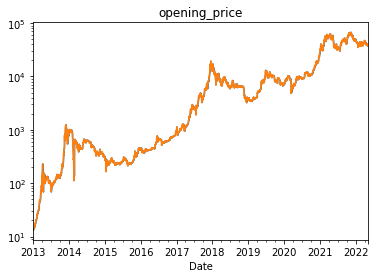

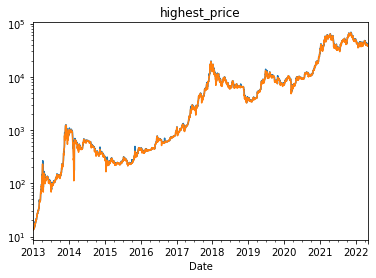

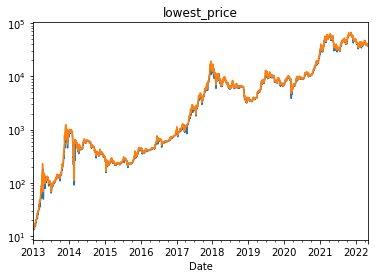

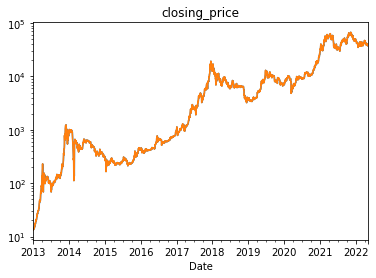

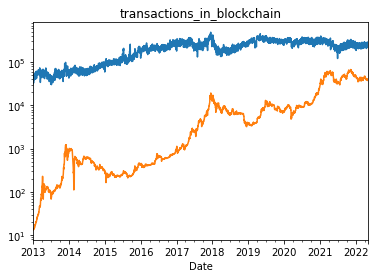

...

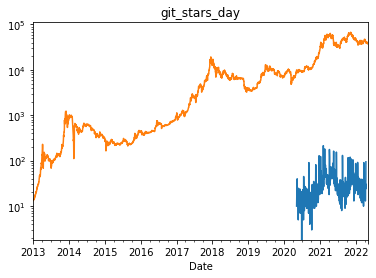

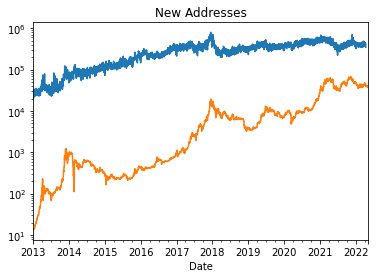

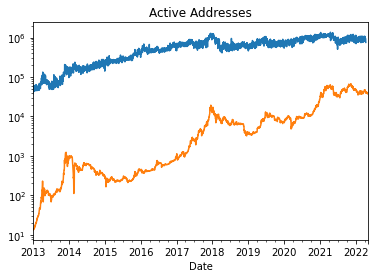

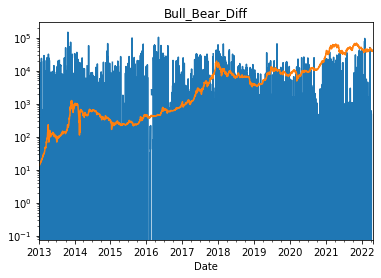

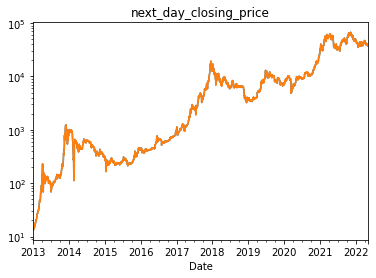

In [59]:
for i, col in enumerate(final_df.columns):
    final_df[col].plot(fig=plt.figure(i))
    final_df['next_day_closing_price'].plot()

    plt.title(col)
    plt.yscale("log")

plt.show()

In [60]:
## We will analyze only from 2018 as the market is evolving so that previous behaviour do not impact in our analysis

In [61]:
#lets see the features for which we dont have data since 01.01.2018


final_df.apply(pd.Series.first_valid_index)



opening_price                        2013-01-01
highest_price                        2013-01-01
lowest_price                         2013-01-01
closing_price                        2013-01-01
transactions_in_blockchain           2013-01-01
avg_block_size                       2013-01-01
sent_by_adress                       2013-01-01
avg_mining_difficulty                2013-01-01
avg_hashrate                         2013-01-01
mining_profitability                 2013-01-01
sent_coins_in_usd                    2013-01-01
avg_transaction_fees                 2013-01-01
median_transaction_fees              2013-01-01
avg_block_time                       2013-01-01
avg_transaction_value                2013-01-01
median_transaction_value             2013-01-01
tweets_day                           2014-04-09
google_trends                        2013-01-01
active_addresses                     2013-01-01
top100_to_total_percentage           2013-01-01
avg_fee_to_reward                    201

In [62]:
## before  cutting the dataset lets calculate Ichimoku over Bitcoin Price
ichimoku = ta.ichimoku(final_df['highest_price'], final_df['lowest_price'], final_df['closing_price'])


In [63]:
ichimoku[0]

,ISA_9,ISB_26,ITS_9,IKS_26,ICS_26
Date,,,,,
2013-01-01,NaN,NaN,NaN,NaN,17.8
2013-01-02,NaN,NaN,NaN,NaN,18.7
2013-01-03,NaN,NaN,NaN,NaN,19.5
2013-01-04,NaN,NaN,NaN,NaN,19.7
2013-01-05,NaN,NaN,NaN,NaN,20.4
...,...,...,...,...,...
2022-04-27,44059.525,41278.2,40338.5,42571.5,NaN
2022-04-28,44405.850,41278.2,40338.5,42571.5,NaN
2022-04-29,44522.850,41278.2,40338.5,42454.5,NaN


In [64]:
final_df = pd.concat([final_df, ichimoku[0]], axis=1)

# After analyzing the data we take the following decisions:
    - Drop FUTBASIS and SWAPBASIS as they are very recent variables and in adittion BTC futures market is still very weak
    - Rest of variables for which we dont have full data are: 
        - FUTMSCIACWI - 06/01/2020 
        - FUTALT     - 20/07/2019 
        - tweets_positive_ratio, telegram_positive_ratio, telegram_number - substitute from data from santiment -- see below
        - git_stars_day - 2020-05-06 --> Drop this variable
        - Keep ETH and other indexes from 2017 as till 2017 BTC price didnt change much
        
We will take data from 20/07/2019, for the first model, later we will try to improve the data points for take a longer period of time

In [65]:
# Drop data from  FUTMSCIACWI

#final_df.drop(['FUTMSCIACWI'],axis=1,inplace=True)

In [66]:
# Take data from santiment - CSV

# we will substitute also tweets day and telegram day by the social volume in santiment, which is more complete

final_df.drop(['tweets_positive_negative_ratio_adj','telegram_positive_ratio_adj', 'telegram_number', 'git_stars_day'],axis=1,inplace=True)

santiment_df=pd.read_csv('data/santiment.csv')
santiment_df



,Date,Social Volume,Social Volume AI,Positive sentiment (Total),Negative sentiment (Total),Weighted sentiment (Total)
0,2010-05-11T00:00:00.000Z,2,4,0.000000,0.000000,NaN
1,2010-05-12T00:00:00.000Z,1,2,0.000000,0.000000,NaN
2,2010-05-13T00:00:00.000Z,1,2,0.000000,0.000000,NaN
3,2010-05-14T00:00:00.000Z,4,7,0.000000,0.955811,NaN
4,2010-05-15T00:00:00.000Z,0,7,0.000000,0.000000,NaN
...,...,...,...,...,...,...
4360,2022-04-18T00:00:00.000Z,13512,19130,5186.965232,787.376231,0.332269
4361,2022-04-19T00:00:00.000Z,14621,19475,6205.641463,631.928064,1.245056
4362,2022-04-20T00:00:00.000Z,17633,23443,7783.578235,639.665058,2.703846
4363,2022-04-21T00:00:00.000Z,19948,25122,8948.167152,725.499189,4.018135


In [67]:
santiment_df['Date'] = pd.to_datetime(santiment_df['Date'], format= '%Y-%m-%d')

In [68]:
santiment_df['Date'] = santiment_df["Date"].dt.strftime("%Y-%m-%d")
santiment_df

,Date,Social Volume,Social Volume AI,Positive sentiment (Total),Negative sentiment (Total),Weighted sentiment (Total)
0,2010-05-11,2,4,0.000000,0.000000,NaN
1,2010-05-12,1,2,0.000000,0.000000,NaN
2,2010-05-13,1,2,0.000000,0.000000,NaN
3,2010-05-14,4,7,0.000000,0.955811,NaN
4,2010-05-15,0,7,0.000000,0.000000,NaN
...,...,...,...,...,...,...
4360,2022-04-18,13512,19130,5186.965232,787.376231,0.332269
4361,2022-04-19,14621,19475,6205.641463,631.928064,1.245056
4362,2022-04-20,17633,23443,7783.578235,639.665058,2.703846
4363,2022-04-21,19948,25122,8948.167152,725.499189,4.018135


In [69]:
santiment_df

,Date,Social Volume,Social Volume AI,Positive sentiment (Total),Negative sentiment (Total),Weighted sentiment (Total)
0,2010-05-11,2,4,0.000000,0.000000,NaN
1,2010-05-12,1,2,0.000000,0.000000,NaN
2,2010-05-13,1,2,0.000000,0.000000,NaN
3,2010-05-14,4,7,0.000000,0.955811,NaN
4,2010-05-15,0,7,0.000000,0.000000,NaN
...,...,...,...,...,...,...
4360,2022-04-18,13512,19130,5186.965232,787.376231,0.332269
4361,2022-04-19,14621,19475,6205.641463,631.928064,1.245056
4362,2022-04-20,17633,23443,7783.578235,639.665058,2.703846
4363,2022-04-21,19948,25122,8948.167152,725.499189,4.018135


In [70]:
santiment_df = santiment_df[(santiment_df['Date'] >= '2013-01-01')].reset_index(drop=True)
santiment_df = santiment_df[(santiment_df['Date'] < '2022-04-01')].reset_index(drop=True)

In [71]:
final_df = final_df[(final_df.index >= '2013-01-01')]
final_df = final_df[(final_df.index < '2022-04-01')]


In [72]:
final_df

,opening_price,highest_price,lowest_price,closing_price,transactions_in_blockchain,avg_block_size,sent_by_adress,avg_mining_difficulty,avg_hashrate,mining_profitability,...,profit_losses_ratio_adj,New Addresses,Active Addresses,Bull_Bear_Diff,next_day_closing_price,ISA_9,ISB_26,ITS_9,IKS_26,ICS_26
Date,,,,,,,,,,,,,,,,,,,,,
2013-01-01,13.5,13.6,13.2,13.3,31734.0,89033.0,26174.0,2.979637e+06,2.433154e+13,2246.000,...,0.467087,20052.0,37847.0,-4885.43,13.3,NaN,NaN,NaN,NaN,17.8
2013-01-02,13.3,13.4,13.2,13.3,39280.0,114077.0,31809.0,2.979637e+06,2.280465e+13,2233.000,...,0.418064,24209.0,43104.0,7947.75,13.4,NaN,NaN,NaN,NaN,18.7
2013-01-03,13.3,13.5,13.3,13.4,42147.0,108023.0,38197.0,2.979637e+06,2.372489e+13,2276.000,...,0.459380,30280.0,51270.0,-1499.67,13.5,NaN,NaN,NaN,NaN,19.5
2013-01-04,13.4,13.5,13.3,13.5,48436.0,141811.0,34990.0,2.979637e+06,2.260818e+13,2259.000,...,0.477303,25734.0,47341.0,-28891.87,13.4,NaN,NaN,NaN,NaN,19.7
2013-01-05,13.5,13.6,13.3,13.4,39455.0,118240.0,38008.0,2.979637e+06,2.259070e+13,2074.000,...,0.503475,27475.0,53413.0,-134.04,13.4,NaN,NaN,NaN,NaN,20.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-03-27,44542.0,46947.0,44445.0,46859.0,218071.0,595651.0,421737.0,2.745271e+13,1.994591e+20,0.186,...,0.475418,373139.0,819815.0,-1072.48,47105.0,39842.625,39370.4,43738.5,42064.55,39709.0
2022-03-28,46859.0,48199.0,46672.0,47105.0,293145.0,683575.0,520476.0,2.745271e+13,1.925705e+20,0.247,...,0.546194,450661.0,1052990.0,-1470.69,47449.0,39941.050,39370.4,44364.5,42690.55,39418.0
2022-03-29,47126.0,48127.0,47029.0,47449.0,286789.0,656320.0,519299.0,2.745271e+13,2.206193e+20,0.206,...,0.546055,441962.0,969097.0,-626.26,47075.0,39941.050,39370.4,44364.5,42690.55,39464.0


In [73]:
santiment_df

,Date,Social Volume,Social Volume AI,Positive sentiment (Total),Negative sentiment (Total),Weighted sentiment (Total)
0,2013-01-01,212,541,25.011040,8.833532,NaN
1,2013-01-02,310,644,37.820980,18.136619,NaN
2,2013-01-03,334,656,39.814842,23.733935,NaN
3,2013-01-04,333,579,49.422451,21.291713,NaN
4,2013-01-05,282,552,41.689466,24.502227,NaN
...,...,...,...,...,...,...
3372,2022-03-27,13724,18632,5746.536697,739.039131,-0.368552
3373,2022-03-28,15572,20097,6654.973674,813.449360,0.243179
3374,2022-03-29,13815,18943,5042.911351,909.972081,-0.679319
3375,2022-03-30,14170,19972,4574.211594,772.837805,-0.862203


In [74]:
final_df['Social_Volume'] = list(santiment_df['Social Volume'])
final_df['Social_Volume_AI'] = list(santiment_df['Social Volume AI'])
final_df['Weighted sentiment'] = list(santiment_df['Weighted sentiment (Total)'])
final_df

,opening_price,highest_price,lowest_price,closing_price,transactions_in_blockchain,avg_block_size,sent_by_adress,avg_mining_difficulty,avg_hashrate,mining_profitability,...,Bull_Bear_Diff,next_day_closing_price,ISA_9,ISB_26,ITS_9,IKS_26,ICS_26,Social_Volume,Social_Volume_AI,Weighted sentiment
Date,,,,,,,,,,,,,,,,,,,,,
2013-01-01,13.5,13.6,13.2,13.3,31734.0,89033.0,26174.0,2.979637e+06,2.433154e+13,2246.000,...,-4885.43,13.3,NaN,NaN,NaN,NaN,17.8,212,541,NaN
2013-01-02,13.3,13.4,13.2,13.3,39280.0,114077.0,31809.0,2.979637e+06,2.280465e+13,2233.000,...,7947.75,13.4,NaN,NaN,NaN,NaN,18.7,310,644,NaN
2013-01-03,13.3,13.5,13.3,13.4,42147.0,108023.0,38197.0,2.979637e+06,2.372489e+13,2276.000,...,-1499.67,13.5,NaN,NaN,NaN,NaN,19.5,334,656,NaN
2013-01-04,13.4,13.5,13.3,13.5,48436.0,141811.0,34990.0,2.979637e+06,2.260818e+13,2259.000,...,-28891.87,13.4,NaN,NaN,NaN,NaN,19.7,333,579,NaN
2013-01-05,13.5,13.6,13.3,13.4,39455.0,118240.0,38008.0,2.979637e+06,2.259070e+13,2074.000,...,-134.04,13.4,NaN,NaN,NaN,NaN,20.4,282,552,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-03-27,44542.0,46947.0,44445.0,46859.0,218071.0,595651.0,421737.0,2.745271e+13,1.994591e+20,0.186,...,-1072.48,47105.0,39842.625,39370.4,43738.5,42064.55,39709.0,13724,18632,-0.368552
2022-03-28,46859.0,48199.0,46672.0,47105.0,293145.0,683575.0,520476.0,2.745271e+13,1.925705e+20,0.247,...,-1470.69,47449.0,39941.050,39370.4,44364.5,42690.55,39418.0,15572,20097,0.243179
2022-03-29,47126.0,48127.0,47029.0,47449.0,286789.0,656320.0,519299.0,2.745271e+13,2.206193e+20,0.206,...,-626.26,47075.0,39941.050,39370.4,44364.5,42690.55,39464.0,13815,18943,-0.679319


In [75]:
# For our final DF we will take Social Volume, Social volume AI and the weighted sentiment
final_df

,opening_price,highest_price,lowest_price,closing_price,transactions_in_blockchain,avg_block_size,sent_by_adress,avg_mining_difficulty,avg_hashrate,mining_profitability,...,Bull_Bear_Diff,next_day_closing_price,ISA_9,ISB_26,ITS_9,IKS_26,ICS_26,Social_Volume,Social_Volume_AI,Weighted sentiment
Date,,,,,,,,,,,,,,,,,,,,,
2013-01-01,13.5,13.6,13.2,13.3,31734.0,89033.0,26174.0,2.979637e+06,2.433154e+13,2246.000,...,-4885.43,13.3,NaN,NaN,NaN,NaN,17.8,212,541,NaN
2013-01-02,13.3,13.4,13.2,13.3,39280.0,114077.0,31809.0,2.979637e+06,2.280465e+13,2233.000,...,7947.75,13.4,NaN,NaN,NaN,NaN,18.7,310,644,NaN
2013-01-03,13.3,13.5,13.3,13.4,42147.0,108023.0,38197.0,2.979637e+06,2.372489e+13,2276.000,...,-1499.67,13.5,NaN,NaN,NaN,NaN,19.5,334,656,NaN
2013-01-04,13.4,13.5,13.3,13.5,48436.0,141811.0,34990.0,2.979637e+06,2.260818e+13,2259.000,...,-28891.87,13.4,NaN,NaN,NaN,NaN,19.7,333,579,NaN
2013-01-05,13.5,13.6,13.3,13.4,39455.0,118240.0,38008.0,2.979637e+06,2.259070e+13,2074.000,...,-134.04,13.4,NaN,NaN,NaN,NaN,20.4,282,552,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-03-27,44542.0,46947.0,44445.0,46859.0,218071.0,595651.0,421737.0,2.745271e+13,1.994591e+20,0.186,...,-1072.48,47105.0,39842.625,39370.4,43738.5,42064.55,39709.0,13724,18632,-0.368552
2022-03-28,46859.0,48199.0,46672.0,47105.0,293145.0,683575.0,520476.0,2.745271e+13,1.925705e+20,0.247,...,-1470.69,47449.0,39941.050,39370.4,44364.5,42690.55,39418.0,15572,20097,0.243179
2022-03-29,47126.0,48127.0,47029.0,47449.0,286789.0,656320.0,519299.0,2.745271e+13,2.206193e+20,0.206,...,-626.26,47075.0,39941.050,39370.4,44364.5,42690.55,39464.0,13815,18943,-0.679319


In [76]:
final_df.drop(['FUTBASIS','SWAPBASIS'],axis=1,inplace=True)
final_df.drop(['bc_volatility'],axis=1,inplace=True)


In [77]:
final_df

,opening_price,highest_price,lowest_price,closing_price,transactions_in_blockchain,avg_block_size,sent_by_adress,avg_mining_difficulty,avg_hashrate,mining_profitability,...,Bull_Bear_Diff,next_day_closing_price,ISA_9,ISB_26,ITS_9,IKS_26,ICS_26,Social_Volume,Social_Volume_AI,Weighted sentiment
Date,,,,,,,,,,,,,,,,,,,,,
2013-01-01,13.5,13.6,13.2,13.3,31734.0,89033.0,26174.0,2.979637e+06,2.433154e+13,2246.000,...,-4885.43,13.3,NaN,NaN,NaN,NaN,17.8,212,541,NaN
2013-01-02,13.3,13.4,13.2,13.3,39280.0,114077.0,31809.0,2.979637e+06,2.280465e+13,2233.000,...,7947.75,13.4,NaN,NaN,NaN,NaN,18.7,310,644,NaN
2013-01-03,13.3,13.5,13.3,13.4,42147.0,108023.0,38197.0,2.979637e+06,2.372489e+13,2276.000,...,-1499.67,13.5,NaN,NaN,NaN,NaN,19.5,334,656,NaN
2013-01-04,13.4,13.5,13.3,13.5,48436.0,141811.0,34990.0,2.979637e+06,2.260818e+13,2259.000,...,-28891.87,13.4,NaN,NaN,NaN,NaN,19.7,333,579,NaN
2013-01-05,13.5,13.6,13.3,13.4,39455.0,118240.0,38008.0,2.979637e+06,2.259070e+13,2074.000,...,-134.04,13.4,NaN,NaN,NaN,NaN,20.4,282,552,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-03-27,44542.0,46947.0,44445.0,46859.0,218071.0,595651.0,421737.0,2.745271e+13,1.994591e+20,0.186,...,-1072.48,47105.0,39842.625,39370.4,43738.5,42064.55,39709.0,13724,18632,-0.368552
2022-03-28,46859.0,48199.0,46672.0,47105.0,293145.0,683575.0,520476.0,2.745271e+13,1.925705e+20,0.247,...,-1470.69,47449.0,39941.050,39370.4,44364.5,42690.55,39418.0,15572,20097,0.243179
2022-03-29,47126.0,48127.0,47029.0,47449.0,286789.0,656320.0,519299.0,2.745271e+13,2.206193e+20,0.206,...,-626.26,47075.0,39941.050,39370.4,44364.5,42690.55,39464.0,13815,18943,-0.679319


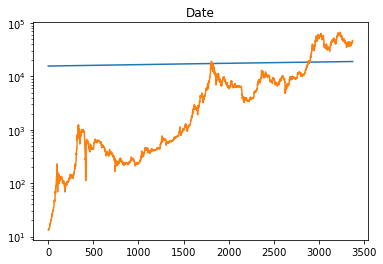

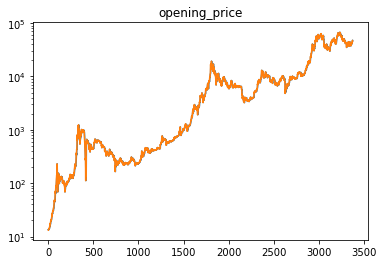

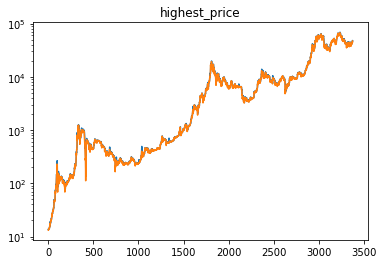

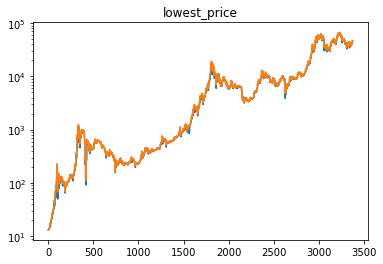

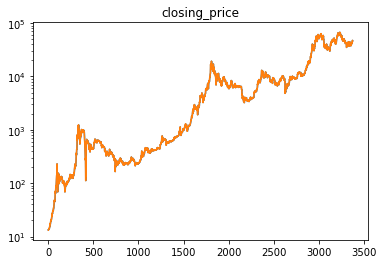

...

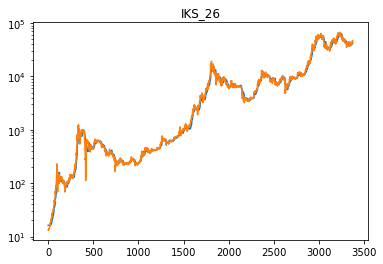

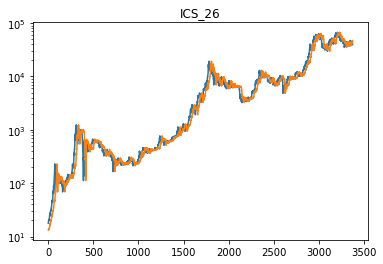

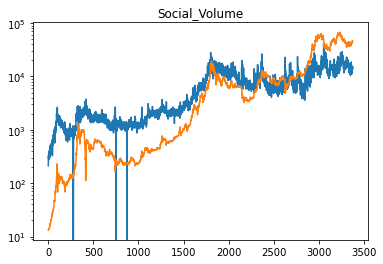

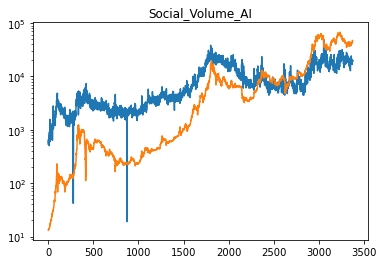

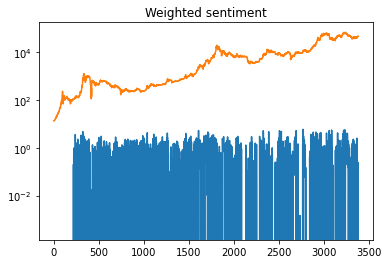

In [91]:
for i, col in enumerate(final_df.columns):
    final_df[col].plot(fig=plt.figure(i))
    final_df['next_day_closing_price'].plot()
    plt.title(col)
    plt.yscale("log")


plt.show()

# NO TENEMOS DATOS DE FUTUROS Y DE INDICES ALTERNATIVOS DE CRYPTOMONEDAS A TAN LARGO PLAZO, LO QUITAMOS
BDM 
FUT BTC 
FUT ALT

## Missing Value Imputation

In [79]:
first_date = FUTBTC_df.apply(pd.Series.first_valid_index)

final_df.reset_index(inplace=True)

final_df['FUTBTC_spot'].loc[final_df['Date'] < first_date[0].strftime("%Y-%m-%d")] = final_df['closing_price'].loc[final_df['Date'] < first_date[0].strftime("%Y-%m-%d")]
final_df.set_index('Date')

,opening_price,highest_price,lowest_price,closing_price,transactions_in_blockchain,avg_block_size,sent_by_adress,avg_mining_difficulty,avg_hashrate,mining_profitability,...,Bull_Bear_Diff,next_day_closing_price,ISA_9,ISB_26,ITS_9,IKS_26,ICS_26,Social_Volume,Social_Volume_AI,Weighted sentiment
Date,,,,,,,,,,,,,,,,,,,,,
2013-01-01,13.5,13.6,13.2,13.3,31734.0,89033.0,26174.0,2.979637e+06,2.433154e+13,2246.000,...,-4885.43,13.3,NaN,NaN,NaN,NaN,17.8,212,541,NaN
2013-01-02,13.3,13.4,13.2,13.3,39280.0,114077.0,31809.0,2.979637e+06,2.280465e+13,2233.000,...,7947.75,13.4,NaN,NaN,NaN,NaN,18.7,310,644,NaN
2013-01-03,13.3,13.5,13.3,13.4,42147.0,108023.0,38197.0,2.979637e+06,2.372489e+13,2276.000,...,-1499.67,13.5,NaN,NaN,NaN,NaN,19.5,334,656,NaN
2013-01-04,13.4,13.5,13.3,13.5,48436.0,141811.0,34990.0,2.979637e+06,2.260818e+13,2259.000,...,-28891.87,13.4,NaN,NaN,NaN,NaN,19.7,333,579,NaN
2013-01-05,13.5,13.6,13.3,13.4,39455.0,118240.0,38008.0,2.979637e+06,2.259070e+13,2074.000,...,-134.04,13.4,NaN,NaN,NaN,NaN,20.4,282,552,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-03-27,44542.0,46947.0,44445.0,46859.0,218071.0,595651.0,421737.0,2.745271e+13,1.994591e+20,0.186,...,-1072.48,47105.0,39842.625,39370.4,43738.5,42064.55,39709.0,13724,18632,-0.368552
2022-03-28,46859.0,48199.0,46672.0,47105.0,293145.0,683575.0,520476.0,2.745271e+13,1.925705e+20,0.247,...,-1470.69,47449.0,39941.050,39370.4,44364.5,42690.55,39418.0,15572,20097,0.243179
2022-03-29,47126.0,48127.0,47029.0,47449.0,286789.0,656320.0,519299.0,2.745271e+13,2.206193e+20,0.206,...,-626.26,47075.0,39941.050,39370.4,44364.5,42690.55,39464.0,13815,18943,-0.679319


In [80]:
pd.set_option('display.max_rows', None)
missing_values = pd.DataFrame(final_df.isna().sum(),columns=['missing_count'])
missing_values.sort_values(by='missing_count',ascending=False)

,missing_count
FUTALT,2391
BDM_spot,2049
FUTMSCIACWI_spot,1430
ETH_spot,1164
lbma_gold,1055
DXY_spot,1049
SP500_spot,1048
VIX_spot,1048
FUTDXY,988
MSCIACW_spot,964


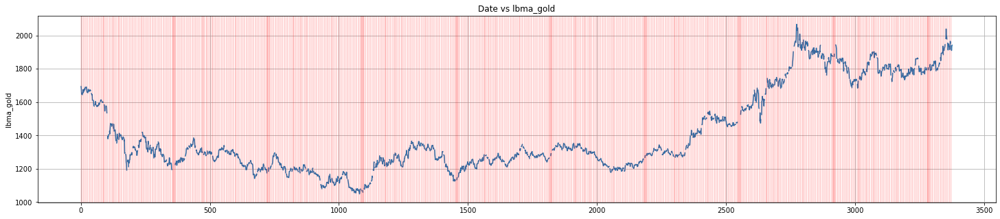

In [81]:
# For quoted values in which weekends and US national holidays are missing we use bfill() so that the last value is remembered
final_df['lbma_gold'].plot(x=final_df.index,y='lbma_gold',figsize=(25,5),grid=True)
for i in list(final_df.loc[pd.isna(final_df['lbma_gold']), :].index):
    plt.axvline(x=i,color='r',alpha=0.1)
plt.ylabel('lbma_gold')
plt.title('Date vs lbma_gold')
plt.show()


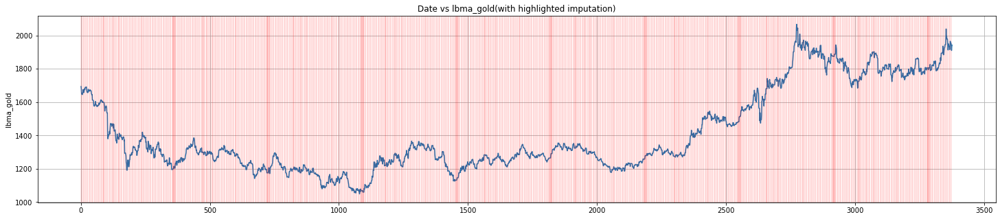

In [82]:
final_df['lbma_gold'].fillna(final_df['lbma_gold'].ffill().astype(float)).plot(x=final_df.index,y='lbma_gold',figsize=(25,5),grid=True)
for i in list(final_df.loc[pd.isna(final_df['lbma_gold']), :].index):
    plt.axvline(x=i,color='r',alpha=0.1)
plt.ylabel('lbma_gold')
plt.title('Date vs lbma_gold(with highlighted imputation)')
plt.show()


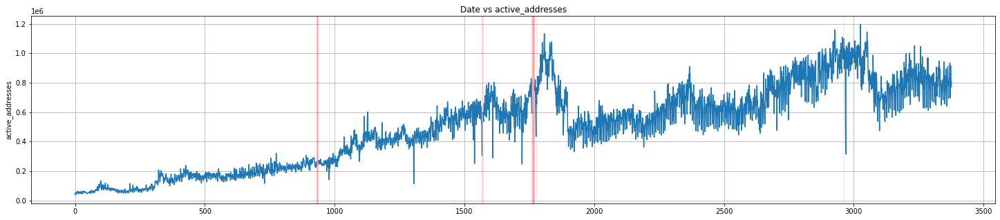

In [83]:
# For missing values we will use the rolling average with interpolate so that we take a 7 days window linear filling

final_df['active_addresses'].plot(x=final_df.index,y='active_addresses',figsize=(25,5),grid=True)
for i in list(final_df.loc[pd.isna(final_df['active_addresses']),:].index):
    plt.axvline(x=i,color='r',alpha=0.1)
plt.ylabel('active_addresses')
plt.title('Date vs active_addresses')
plt.show()

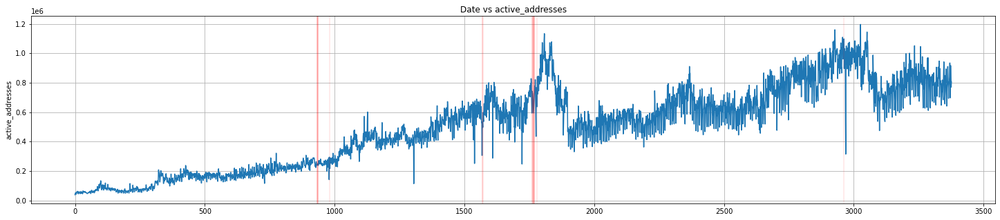

In [84]:
final_df['active_addresses'].fillna(final_df['active_addresses'].rolling(7, min_periods=1).mean().interpolate()).astype(float).plot(x=final_df.index,y='telegram_positive_ratio_adj',figsize=(25,5),grid=True)
for i in list(final_df.loc[pd.isna(final_df['active_addresses']),:].index):
    plt.axvline(x=i,color='r',alpha=0.1)
plt.ylabel('active_addresses')
plt.title('Date vs active_addresses')
plt.show()


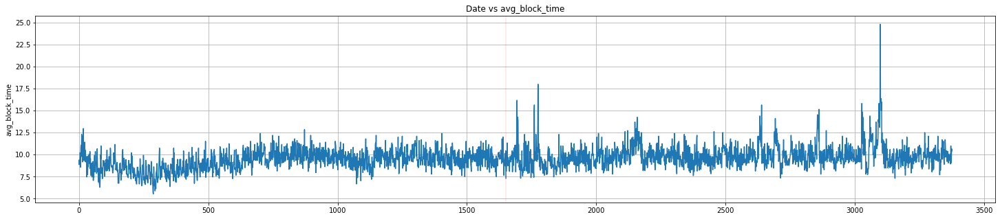

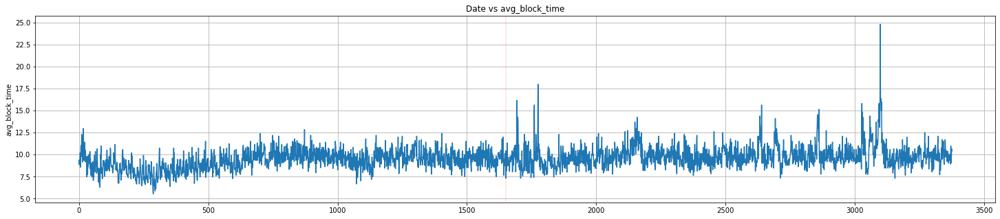

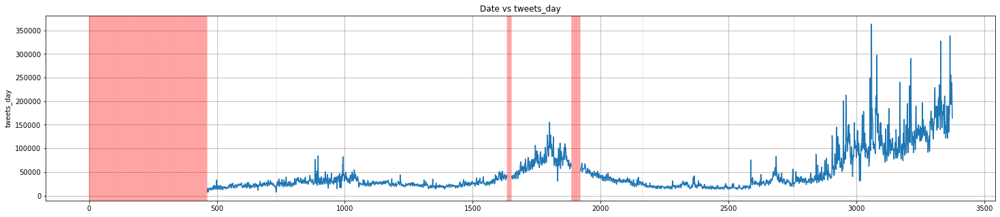

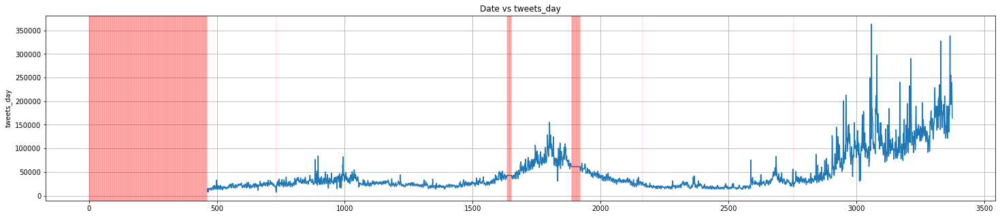

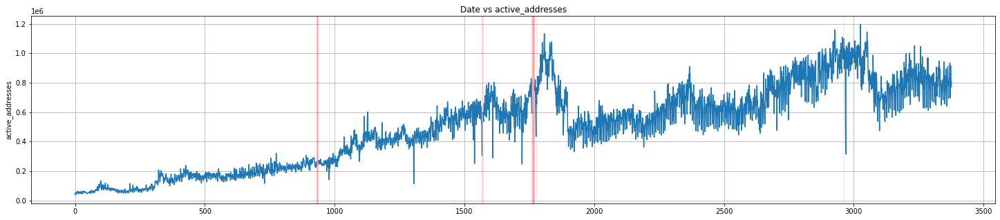

...

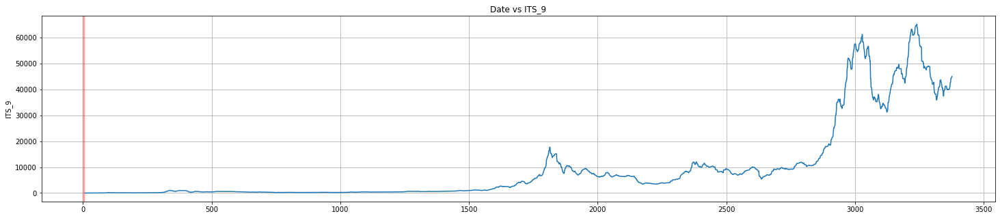

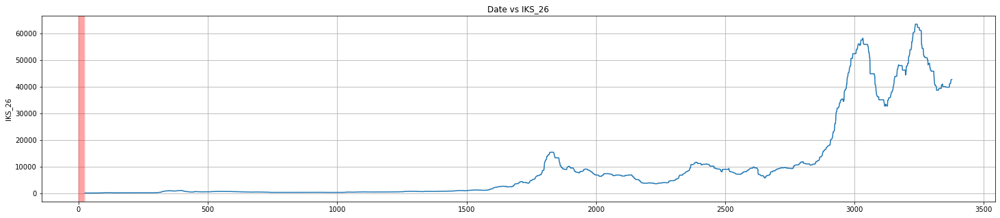

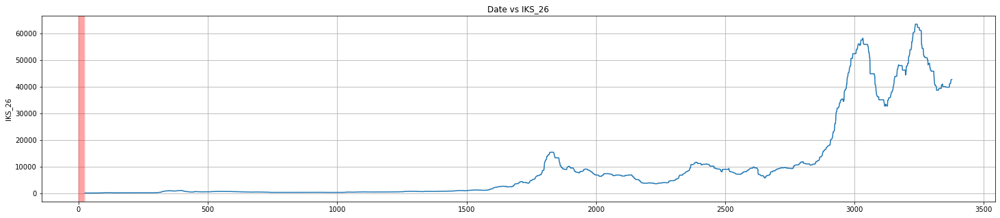

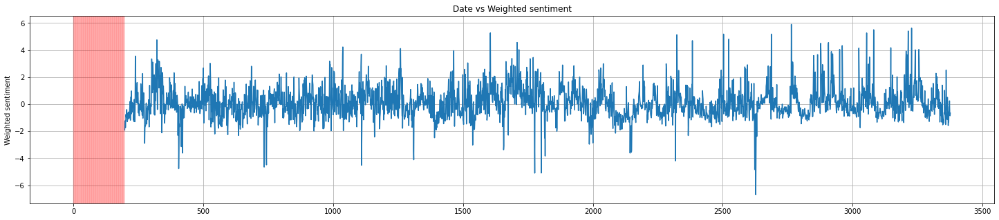

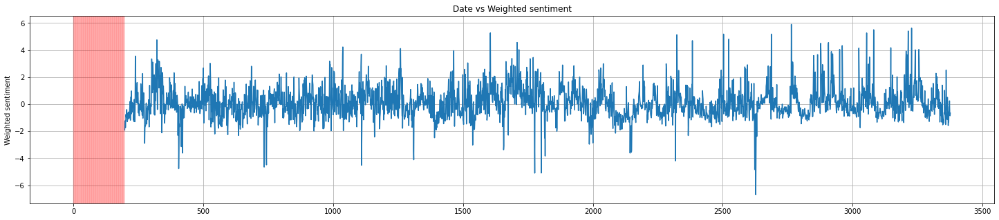

In [85]:
for col in final_df.columns:
    if final_df[col].isna().sum() > 400: # > 100 so that we take the quoted features in which weekends are missing
        
        final_df[col].plot(x=final_df.index,y=col,figsize=(25,5),grid=True)
        for i in list(final_df.loc[pd.isna(final_df[col]),:].index):
            plt.axvline(x=i,color='r',alpha=0.1)
        plt.ylabel(col)
        plt.title('Date vs ' + col)
        plt.show()
        
        final_df[col].fillna(final_df[col].ffill()).plot(x=final_df.index,y=col,figsize=(25,5),grid=True)
        for i in list(final_df.loc[pd.isna(final_df[col]),:].index):
            plt.axvline(x=i,color='r',alpha=0.1)
        plt.ylabel(col)
        plt.title('Date vs ' + col)
        plt.show()
        
        final_df[col] = final_df[col].fillna(final_df[col].ffill())
    
    elif final_df[col].isna().sum() > 0:
        
        final_df[col].plot(x=final_df.index,y=col,figsize=(25,5),grid=True)
        for i in list(final_df.loc[pd.isna(final_df[col]),:].index):
            plt.axvline(x=i,color='r',alpha=0.1)
        plt.ylabel(col)
        plt.title('Date vs ' + col)
        plt.show()
        
        
        final_df[col].fillna(final_df[col].rolling(7, min_periods=1).mean().interpolate()).astype(float).plot(x=final_df.index,y=col,figsize=(25,5),grid=True)
        for i in list(final_df.loc[pd.isna(final_df[col]),:].index):
            plt.axvline(x=i,color='r',alpha=0.1)
        plt.ylabel(col)
        plt.title('Date vs ' + col)
        plt.show()
        
        final_df[col] = final_df[col].fillna(final_df[col].rolling(7, min_periods=1).mean().interpolate())
        
        

In [86]:
final_df.drop(['FUTALT'],axis=1,inplace=True)

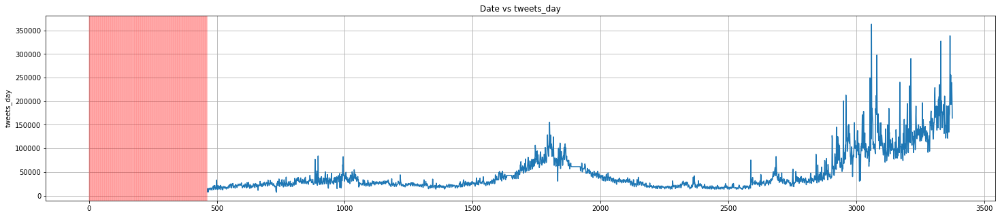

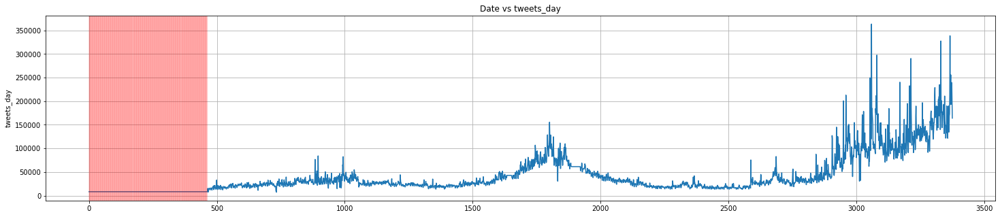

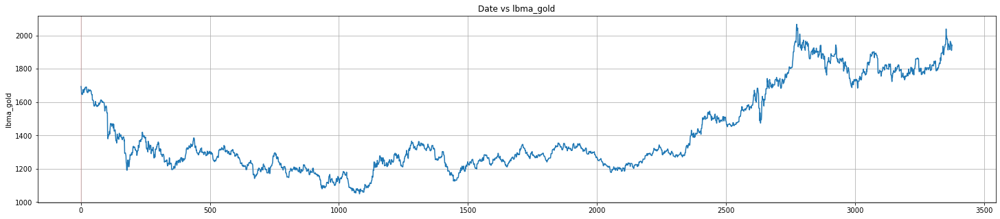

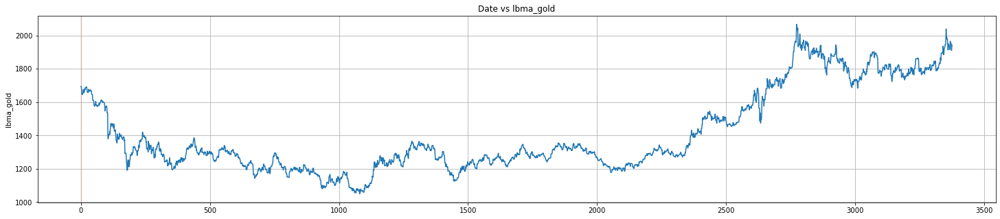

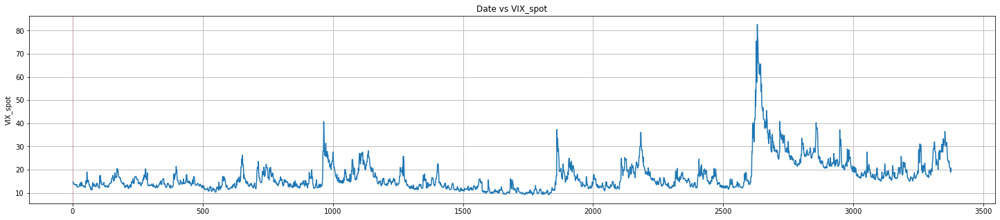

...

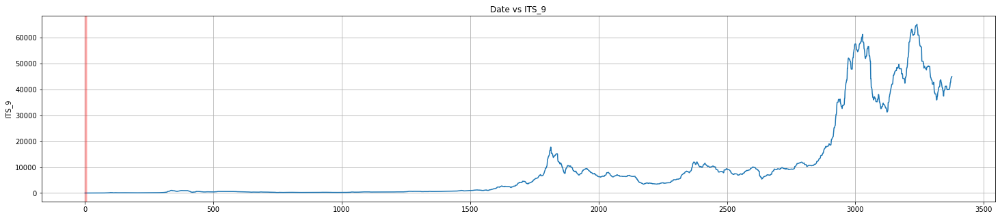

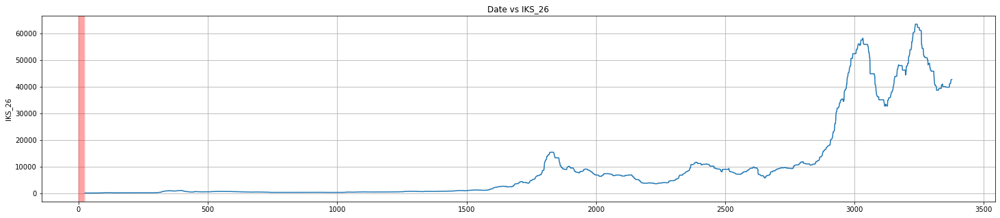

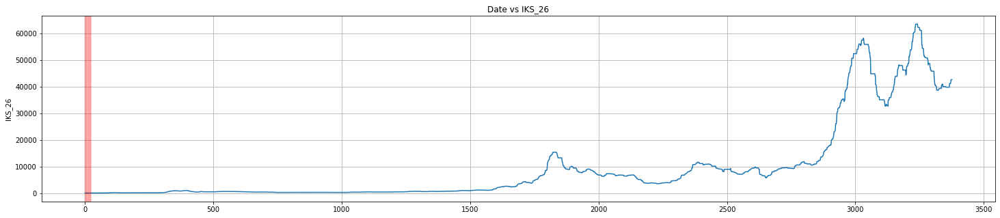

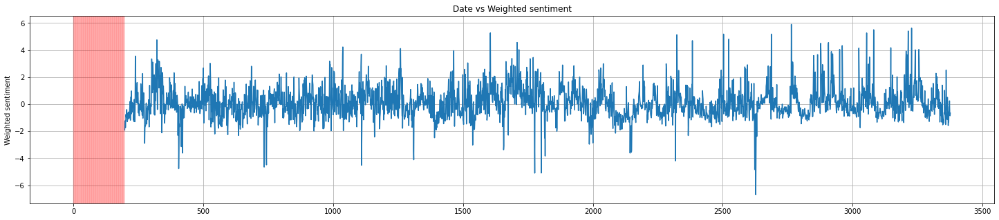

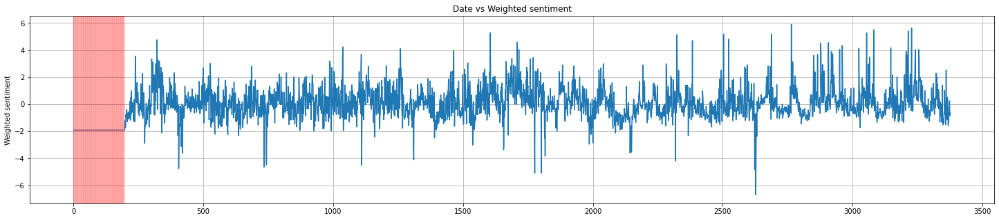

In [87]:
# Le meto otra pasada para completar los missing backfilling

for col in final_df.columns:
    if final_df[col].isna().sum() > 0: # > 100 so that we take the quoted features in which weekends are missing
        
        final_df[col].plot(x=final_df.index,y=col,figsize=(25,5),grid=True)
        for i in list(final_df.loc[pd.isna(final_df[col]),:].index):
            plt.axvline(x=i,color='r',alpha=0.1)
        plt.ylabel(col)
        plt.title('Date vs ' + col)
        plt.show()
        
        final_df[col].fillna(final_df[col].bfill()).plot(x=final_df.index,y=col,figsize=(25,5),grid=True)
        for i in list(final_df.loc[pd.isna(final_df[col]),:].index):
            plt.axvline(x=i,color='r',alpha=0.1)
        plt.ylabel(col)
        plt.title('Date vs ' + col)
        plt.show()
        
        final_df[col] = final_df[col].fillna(final_df[col].bfill())

In [88]:
final_df.drop(final_df.tail(1).index,inplace=True)
missing_values = pd.DataFrame(final_df.isna().sum(),columns=['missing_count'])
missing_values.sort_values(by='missing_count',ascending=False)

,missing_count
Date,0
WTI_spot,0
FUTBTC_spot,0
FUTWTI,0
FUT500,0
FUTGOLD,0
FUTVIX,0
FUTDXY,0
SP500_spot,0
DXY_spot,0


In [89]:
# We will drop telegram number of tweets as there is a very big increase in 2020 that I'm not able to explain and may impact the model



In [90]:
final_df.to_csv('data/final_df.csv')